# **Importing the Data**

In [143]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import itertools
from joblib import Parallel, delayed
import os
import multiprocessing

from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import sklearn.model_selection as skm

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd

from scipy.stats import f_oneway
from scipy.stats import kruskal

import seaborn as sns

from scikit_posthocs import posthoc_dunn

from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping
from keras.layers import Dropout
from keras.regularizers import l2

In [2]:
#from google.colab import drive
#drive.mount('/content/drive')

In [3]:
# For Barouyr
data1 = pd.read_csv("BETN073-1990_2012.csv")
data2 = pd.read_csv("BETN073-2013_2022.csv")
ozone_data = pd.concat([data1,data2])
ozone_data = ozone_data.reset_index()

In [4]:
# For Luis
#data1 = pd.read_csv("/content/drive/My Drive/DataThesis/BETN073/BETN073-1990_2012.csv")
#data2 = pd.read_csv("/content/drive/My Drive/DataThesis/BETN073/BETN073-2013_2022.csv")
#ozone_data = pd.concat([data1,data2])
#ozone_data = ozone_data.reset_index()

# **Preprocessing**

Select the data where that will be used for the model which includes the hourly data from 2008 to 2019. The unnecessary columns are moved to only keep the columns with concentration values and the date and time at which each concentration is measured.

## Making Concentration values NA for validity = 0 and validity = 1

In [5]:
ozone_data.head()

,index,Samplingpoint,Pollutant,Start,End,Value,Unit,AggType,Validity,Verification,ResultTime,DataCapture,FkObservationLog
0,0,BE/SPO-BETN073_00007_100,7,1990-01-01T00:00:00,1990-01-01T01:00:00,47.0,ug.m-3,hour,1,1,2016-08-17T07:51:15.530,0,NaN
1,1,BE/SPO-BETN073_00007_100,7,1990-01-01T01:00:00,1990-01-01T02:00:00,46.0,ug.m-3,hour,1,1,2016-08-17T07:51:15.530,0,NaN
2,2,BE/SPO-BETN073_00007_100,7,1990-01-01T02:00:00,1990-01-01T03:00:00,48.0,ug.m-3,hour,1,1,2016-08-17T07:51:15.530,0,NaN
3,3,BE/SPO-BETN073_00007_100,7,1990-01-01T03:00:00,1990-01-01T04:00:00,48.0,ug.m-3,hour,1,1,2016-08-17T07:51:15.530,0,NaN
4,4,BE/SPO-BETN073_00007_100,7,1990-01-01T04:00:00,1990-01-01T05:00:00,48.0,ug.m-3,hour,1,1,2016-08-17T07:51:15.530,0,NaN


In [6]:
ozone_data['Validity'].unique()

array([ 1, -1,  0], dtype=int64)

In [7]:
# Display examples for each unique value in 'Validity' column
for value in ozone_data['Validity'].unique():
    examples = ozone_data[ozone_data['Validity'] == value].head()
    print(f"Examples for Validity {value}:\n{examples}\n")

Examples for Validity 1:
   index             Samplingpoint  Pollutant                Start  \
0      0  BE/SPO-BETN073_00007_100          7  1990-01-01T00:00:00   
1      1  BE/SPO-BETN073_00007_100          7  1990-01-01T01:00:00   
2      2  BE/SPO-BETN073_00007_100          7  1990-01-01T02:00:00   
3      3  BE/SPO-BETN073_00007_100          7  1990-01-01T03:00:00   
4      4  BE/SPO-BETN073_00007_100          7  1990-01-01T04:00:00   

                   End  Value    Unit AggType  Validity  Verification  \
0  1990-01-01T01:00:00   47.0  ug.m-3    hour         1             1   
1  1990-01-01T02:00:00   46.0  ug.m-3    hour         1             1   
2  1990-01-01T03:00:00   48.0  ug.m-3    hour         1             1   
3  1990-01-01T04:00:00   48.0  ug.m-3    hour         1             1   
4  1990-01-01T05:00:00   48.0  ug.m-3    hour         1             1   

                ResultTime  DataCapture FkObservationLog  
0  2016-08-17T07:51:15.530            0              NaN

In [8]:
# Check rows with Validity = 0 or Validity = -1 and set Value to NaN
ozone_data.loc[(ozone_data['Validity'] == 0) | (ozone_data['Validity'] == -1), 'Value'] = None

In [9]:
# Display examples for each unique value in 'Validity' column
for value in ozone_data['Validity'].unique():
    examples = ozone_data[ozone_data['Validity'] == value].head()
    print(f"Examples for Validity {value}:\n{examples}\n")

Examples for Validity 1:
   index             Samplingpoint  Pollutant                Start  \
0      0  BE/SPO-BETN073_00007_100          7  1990-01-01T00:00:00   
1      1  BE/SPO-BETN073_00007_100          7  1990-01-01T01:00:00   
2      2  BE/SPO-BETN073_00007_100          7  1990-01-01T02:00:00   
3      3  BE/SPO-BETN073_00007_100          7  1990-01-01T03:00:00   
4      4  BE/SPO-BETN073_00007_100          7  1990-01-01T04:00:00   

                   End  Value    Unit AggType  Validity  Verification  \
0  1990-01-01T01:00:00   47.0  ug.m-3    hour         1             1   
1  1990-01-01T02:00:00   46.0  ug.m-3    hour         1             1   
2  1990-01-01T03:00:00   48.0  ug.m-3    hour         1             1   
3  1990-01-01T04:00:00   48.0  ug.m-3    hour         1             1   
4  1990-01-01T05:00:00   48.0  ug.m-3    hour         1             1   

                ResultTime  DataCapture FkObservationLog  
0  2016-08-17T07:51:15.530            0              NaN

In [10]:
columns_remove = ['Samplingpoint','Pollutant','End','Unit','AggType','Validity','Verification','ResultTime','DataCapture','FkObservationLog','index']
ozone_data = ozone_data.drop(columns=columns_remove)

# Sampling Point: BE/SPO-BETN073_00007_100
# Pollutant: 7 (O_3)
# End: Start with 1 hour added
# Unit: ug.m-3
# Aggregation Type: hour
# Validaity/Verification: 1 & 1
# Result Time: Time and Date when data is added to the whole data file
# Data Capture: 0
# FkObservation log: Do not know meaning, values from NaN to 0fa5da4d-ae92-4bb7-bcd4-07fb6b962ae4

ozone_data['Start'] = pd.to_datetime(ozone_data['Start'])
data = ozone_data[(ozone_data['Start'].dt.year >= 2008) & (ozone_data['Start'].dt.year <= 2019)]
data = data.reset_index()
data = data.drop(columns=['index'])
data.rename(columns={'Value': 'Concentration'}, inplace=True)

Thus the following dataframe only

In [11]:
data.head()

,Start,Concentration
0,2008-01-01 00:00:00,0.0
1,2008-01-01 01:00:00,1.0
2,2008-01-01 02:00:00,0.0
3,2008-01-01 03:00:00,2.0
4,2008-01-01 04:00:00,1.0


The data is checked to make sure there are no duplicates.

In [12]:
duplicates = data.duplicated(subset=['Start'])

# Print or further process the duplicate values
print("Duplicate values in the column Start:", duplicates.any())

Duplicate values in the column Start: False


## Adding new variables

From the Start column, we extracr the year, month, day and time.

In [14]:
# Extract year, month, day, and time into separate columns
data['Year'] = data['Start'].dt.year
data['Month'] = data['Start'].dt.month
data['Day'] = data['Start'].dt.day
data['Time'] = data['Start'].dt.time

# Display the transformed DataFrame
print(data.head())

                Start  Concentration  Year  Month  Day      Time
0 2008-01-01 00:00:00            0.0  2008      1    1  00:00:00
1 2008-01-01 01:00:00            1.0  2008      1    1  01:00:00
2 2008-01-01 02:00:00            0.0  2008      1    1  02:00:00
3 2008-01-01 03:00:00            2.0  2008      1    1  03:00:00
4 2008-01-01 04:00:00            1.0  2008      1    1  04:00:00


From the Start column the day of the week can be extracted, which can also be used to determine if that measurement was taken during the weekend.

In [15]:
# Extract day of the week
data['DayOfWeek'] = (data['Start'].dt.weekday + 1) % 7

# Create a new column indicating whether the day is a weekend or not
data['Weekend'] = (data['Start'].dt.dayofweek // 5).astype(int)

In [16]:
data.head()

,Start,Concentration,Year,Month,Day,Time,DayOfWeek,Weekend
0,2008-01-01 00:00:00,0.0,2008,1,1,00:00:00,2,0
1,2008-01-01 01:00:00,1.0,2008,1,1,01:00:00,2,0
2,2008-01-01 02:00:00,0.0,2008,1,1,02:00:00,2,0
3,2008-01-01 03:00:00,2.0,2008,1,1,03:00:00,2,0
4,2008-01-01 04:00:00,1.0,2008,1,1,04:00:00,2,0


## Converting the negative values

Missing values are represented by negative concentration values. Thus, these will be converted to NaN to be able to used the describe function to attain some basic measures.

In [17]:
# Can check the issue here
data['Concentration'].describe()

count    99114.000000
mean        45.017011
std         28.889379
min          0.000000
25%         23.000000
50%         43.500000
75%         62.000000
max        238.000000
Name: Concentration, dtype: float64

In [18]:
count_below_zero = (data['Concentration'] < 0).sum()

# Print the count
print("Number of observations with values below 0:", count_below_zero)

data.loc[data['Concentration'] < 0, 'Concentration'] = np.nan

Number of observations with values below 0: 0


In [19]:
data['Concentration'].isna().sum()

5381

Thus, there are 5381 missing observation for the BETN073 station between the years 2008 and 2019.

In [20]:
data['Concentration'].describe()

count    99114.000000
mean        45.017011
std         28.889379
min          0.000000
25%         23.000000
50%         43.500000
75%         62.000000
max        238.000000
Name: Concentration, dtype: float64

## Making the data daily, using 8 hour Mean Max



In [21]:
# Calculate the 8-hour rolling mean
eight_hour_rolling_mean = data.groupby(['Year', 'Month', 'Day'])['Concentration'].rolling(window=8).mean().reset_index(drop=True)

# Add the 8-hour rolling mean as a new column in the original DataFrame
data['EightHourRollingMean'] = eight_hour_rolling_mean

# Group by 'Year', 'Month', and 'Day', and find the daily maximum of the 8-hour mean
data = data.groupby(['Year', 'Month', 'Day']).agg({'EightHourRollingMean': 'max', 'DayOfWeek': 'first', 'Weekend': 'first'}).reset_index()

In [22]:
data.rename(columns={'EightHourRollingMean': 'Concentration'}, inplace=True)

In [23]:
data

,Year,Month,Day,Concentration,DayOfWeek,Weekend
0,2008,1,1,18.5000,2,0
1,2008,1,2,46.1250,3,0
2,2008,1,3,38.2500,4,0
3,2008,1,4,33.1250,5,0
4,2008,1,5,68.2500,6,1
...,...,...,...,...,...,...
4349,2019,12,27,45.2500,5,0
4350,2019,12,28,42.1250,6,1
4351,2019,12,29,32.8750,0,1
4352,2019,12,30,41.6875,1,0


In [24]:
nan_count = data['Concentration'].isna().sum()
print("Number of NaN values in 'Concentration':", nan_count)

Number of NaN values in 'Concentration': 80


In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4354 entries, 0 to 4353
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Year           4354 non-null   int64  
 1   Month          4354 non-null   int64  
 2   Day            4354 non-null   int64  
 3   Concentration  4274 non-null   float64
 4   DayOfWeek      4354 non-null   int64  
 5   Weekend        4354 non-null   int32  
dtypes: float64(1), int32(1), int64(4)
memory usage: 187.2 KB


In [26]:
# Check for NaN values in the entire DataFrame
nan_rows = data[data.isna().any(axis=1)]

# Print the rows with NaN values
print("Rows with NaN values:")
print(nan_rows)

Rows with NaN values:
      Year  Month  Day  Concentration  DayOfWeek  Weekend
41    2008      2   11            NaN          1        0
42    2008      2   12            NaN          2        0
43    2008      2   13            NaN          3        0
44    2008      2   14            NaN          4        0
138   2008      5   18            NaN          0        1
...    ...    ...  ...            ...        ...      ...
4052  2019      3    5            NaN          2        0
4053  2019      3    6            NaN          3        0
4054  2019      3    7            NaN          4        0
4055  2019      3    8            NaN          5        0
4113  2019      5    5            NaN          0        1

[80 rows x 6 columns]


In [27]:
#data['Concentration'] = np.interp(data.index, data.dropna().index, data['Concentration'].dropna())

In [28]:
#nan_count = data['Concentration'].isna().sum()
#print("Number of NaN values in 'Concentration':", nan_count)

In [29]:
data['Date'] = pd.to_datetime(data[['Year', 'Month', 'Day']])

# Set 'Date' as the index
data.set_index('Date', inplace=True)

data.head()

,Year,Month,Day,Concentration,DayOfWeek,Weekend
Date,,,,,,
2008-01-01,2008,1,1,18.500,2,0
2008-01-02,2008,1,2,46.125,3,0
2008-01-03,2008,1,3,38.250,4,0
2008-01-04,2008,1,4,33.125,5,0
2008-01-05,2008,1,5,68.250,6,1


## EDA on Year, Month, Day, DayOfWeek, Weekend 

### Year

In [30]:
summary_statistics_year = data['Year'].describe()
print(summary_statistics_year)

count    4354.000000
mean     2013.515618
std         3.457379
min      2008.000000
25%      2011.000000
50%      2014.000000
75%      2017.000000
max      2019.000000
Name: Year, dtype: float64


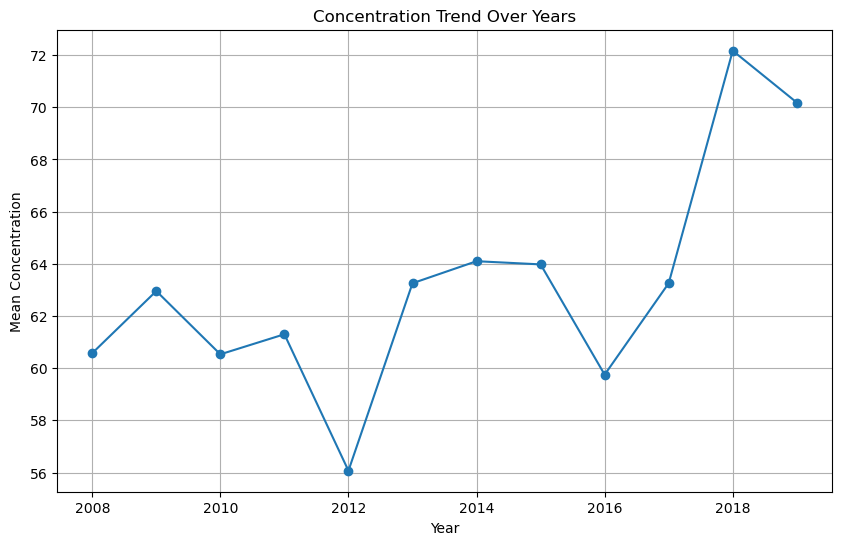

In [32]:
### Trend analyysis:

# Group the data by Year and calculate the mean concentration for each year
trend_data = data.groupby('Year')['Concentration'].mean()

# Plotting the trend
plt.figure(figsize=(10, 6))
plt.plot(trend_data.index, trend_data.values, marker='o', linestyle='-')
plt.title('Concentration Trend Over Years')
plt.xlabel('Year')
plt.ylabel('Mean Concentration')
plt.grid(True)
plt.show()

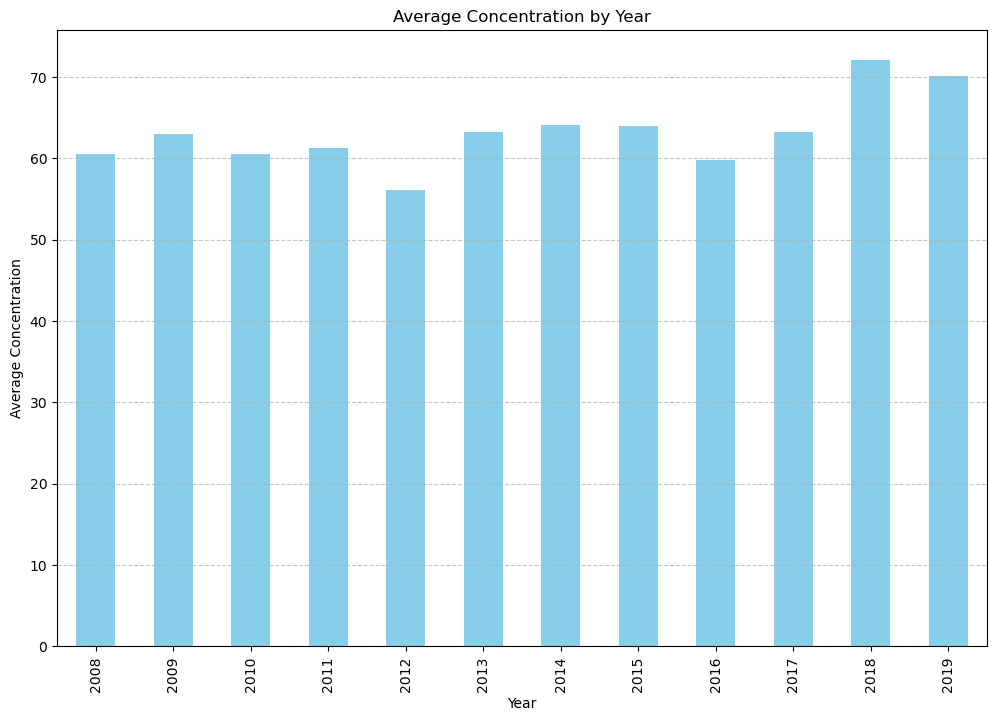

In [33]:
### Bar graphs 

# Group the data by Year and calculate the mean concentration for each year
yearly_concentration = data.groupby('Year')['Concentration'].mean()

# Plotting the bar graph
plt.figure(figsize=(12, 8))
yearly_concentration.plot(kind='bar', color='skyblue')
plt.title('Average Concentration by Year')
plt.xlabel('Year')
plt.ylabel('Average Concentration')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

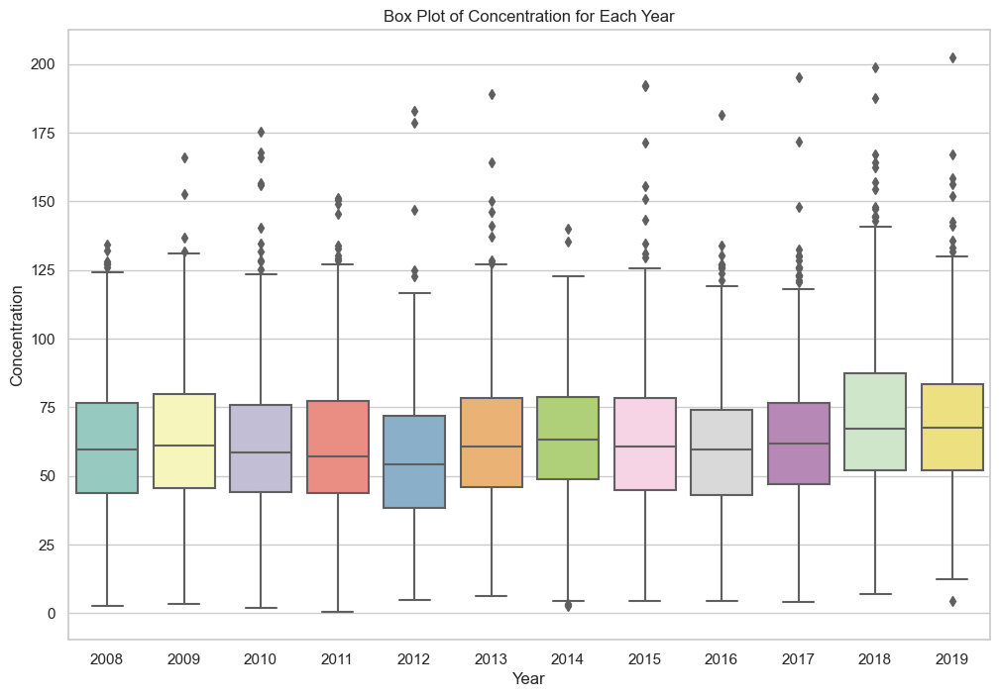

In [43]:
### Which year has the most outliers:

# Setting the style for better visualization
sns.set(style="whitegrid")

# Plotting box plots for each year
plt.figure(figsize=(12, 8))
sns.boxplot(x='Year', y='Concentration', data=data, palette='Set3')
plt.title('Box Plot of Concentration for Each Year')
plt.xlabel('Year')
plt.ylabel('Concentration')
plt.show()

In [45]:
### Which year has the most outliers:

# Calculate Z-scores for Concentration
data['Z_score'] = (data['Concentration'] - data['Concentration'].mean()) / data['Concentration'].std()

# Define a threshold for considering points as outliers (e.g., Z-score > 3 or < -3)
outlier_threshold = 3

# Identify and count outliers for each year
outliers_by_year = data.groupby('Year')['Z_score'].apply(lambda x: (abs(x) > outlier_threshold).sum()).reset_index()
outliers_by_year.columns = ['Year', 'Number_of_Outliers']

# Print the result
print(outliers_by_year)

    Year  Number_of_Outliers
0   2008                   0
1   2009                   2
2   2010                   5
3   2011                   3
4   2012                   2
5   2013                   3
6   2014                   0
7   2015                   5
8   2016                   1
9   2017                   3
10  2018                   9
11  2019                   5


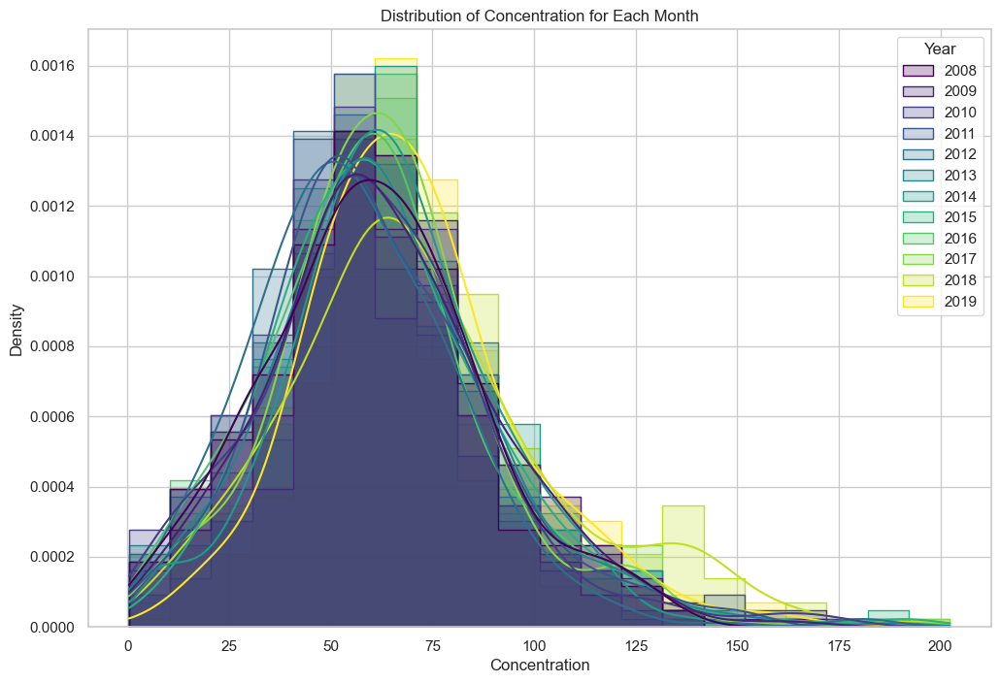

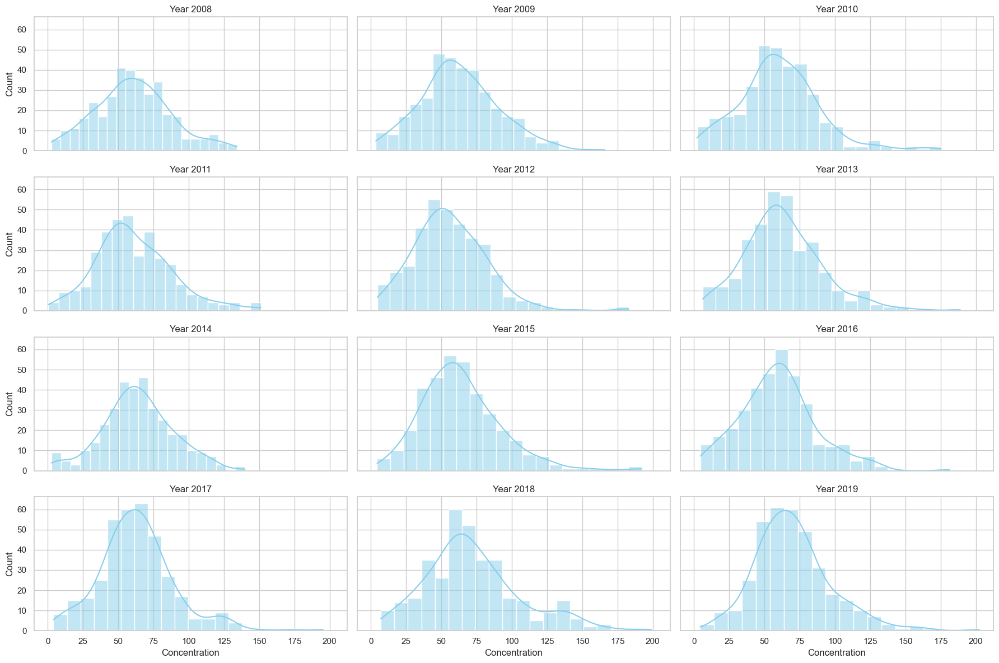

In [67]:
### Distribution of each year

# Setting the style for better visualization
sns.set(style="whitegrid")

# Plotting histograms for each month
plt.figure(figsize=(12, 8))
sns.histplot(data, x='Concentration', hue='Year', bins=20, kde=True, palette='viridis', element='step', stat='density')
plt.title('Distribution of Concentration for Each Month')
plt.xlabel('Concentration')
plt.ylabel('Density')
plt.show()

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create subplots for each year
fig, axes = plt.subplots(4, 3, figsize=(18, 12), sharex=True, sharey=True)

# Flatten the axes for easier indexing
axes = axes.flatten()

# Plot histograms for each year
for i, (year, group) in enumerate(data.groupby('Year')):
    sns.histplot(group['Concentration'], bins=20, kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Year {year}')

# Adjust layout
plt.tight_layout()
plt.show()

### Month 

In [46]:
# Summary statistics for the "Month" variable
summary_statistics_month = data['Month'].describe()
print(summary_statistics_month)

count    4354.000000
mean        6.517226
std         3.445857
min         1.000000
25%         4.000000
50%         7.000000
75%         9.750000
max        12.000000
Name: Month, dtype: float64


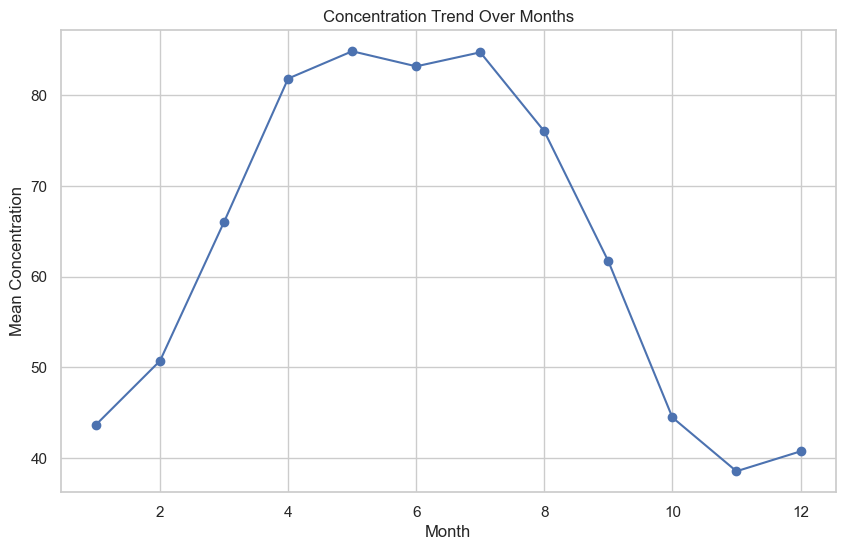

In [48]:
### Trend analysis

# Group the data by Month and calculate the mean concentration for each month
trend_data_month = data.groupby('Month')['Concentration'].mean()

# Plotting the trend for each month
plt.figure(figsize=(10, 6))
plt.plot(trend_data_month.index, trend_data_month.values, marker='o', linestyle='-')
plt.title('Concentration Trend Over Months')
plt.xlabel('Month')
plt.ylabel('Mean Concentration')
plt.grid(True)
plt.show()

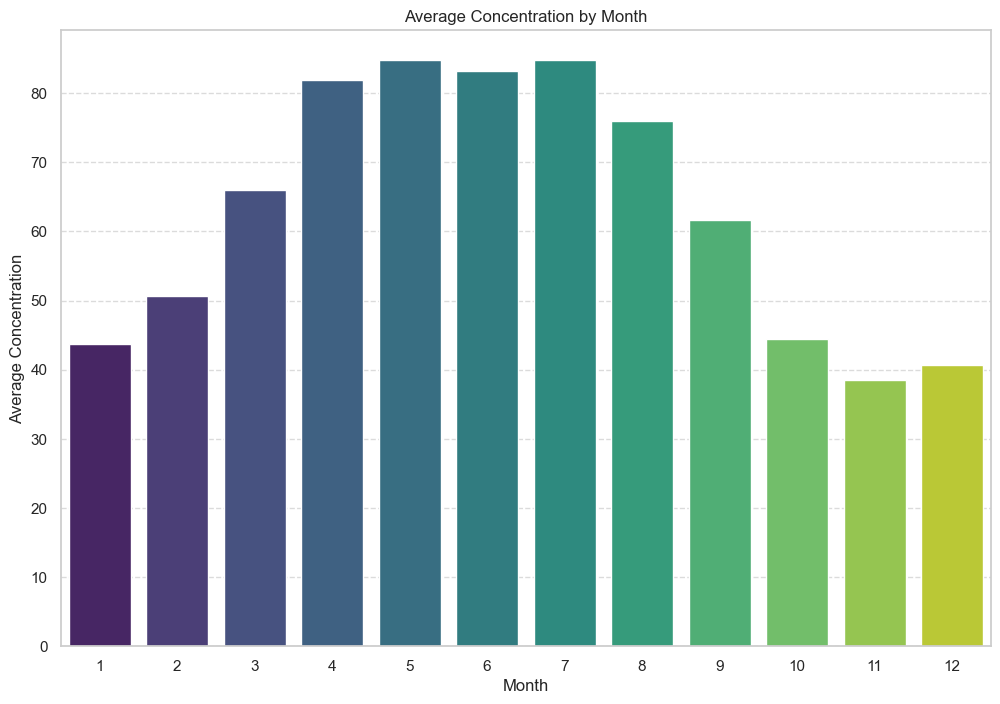

In [51]:
### Bar graph of different months

# Group the data by Month and calculate the mean concentration for each month
monthly_concentration = data.groupby('Month')['Concentration'].mean()

# Plotting the bar graph
plt.figure(figsize=(12, 8))
sns.barplot(x=monthly_concentration.index, y=monthly_concentration.values, palette='viridis')
plt.title('Average Concentration by Month')
plt.xlabel('Month')
plt.ylabel('Average Concentration')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

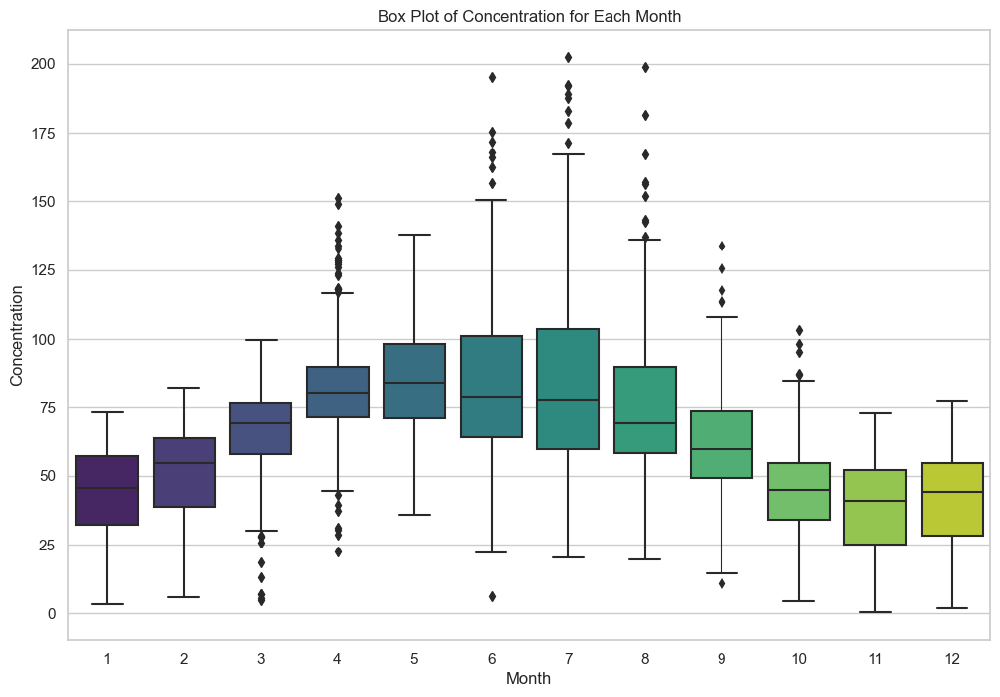

In [53]:
### Outlier detection for each month

# Setting the style for better visualization
sns.set(style="whitegrid")

# Plotting box plots for each month
plt.figure(figsize=(12, 8))
sns.boxplot(x='Month', y='Concentration', data=data, palette='viridis')
plt.title('Box Plot of Concentration for Each Month')
plt.xlabel('Month')
plt.ylabel('Concentration')
plt.show()

In [54]:
### Which month has the most outliers

# Calculate Z-scores for Concentration within each month
data['Z_score_month'] = data.groupby('Month')['Concentration'].transform(lambda x: (x - x.mean()) / x.std())

# Define a threshold for considering points as outliers (e.g., Z-score > 3 or < -3)
outlier_threshold_month = 3

# Identify and count outliers for each month
outliers_by_month = data.groupby('Month')['Z_score_month'].apply(lambda x: (abs(x) > outlier_threshold_month).sum()).reset_index()
outliers_by_month.columns = ['Month', 'Number_of_Outliers']

# Print the result
print(outliers_by_month)

    Month  Number_of_Outliers
0       1                   0
1       2                   0
2       3                   5
3       4                   5
4       5                   0
5       6                   5
6       7                   5
7       8                   5
8       9                   2
9      10                   3
10     11                   0
11     12                   0


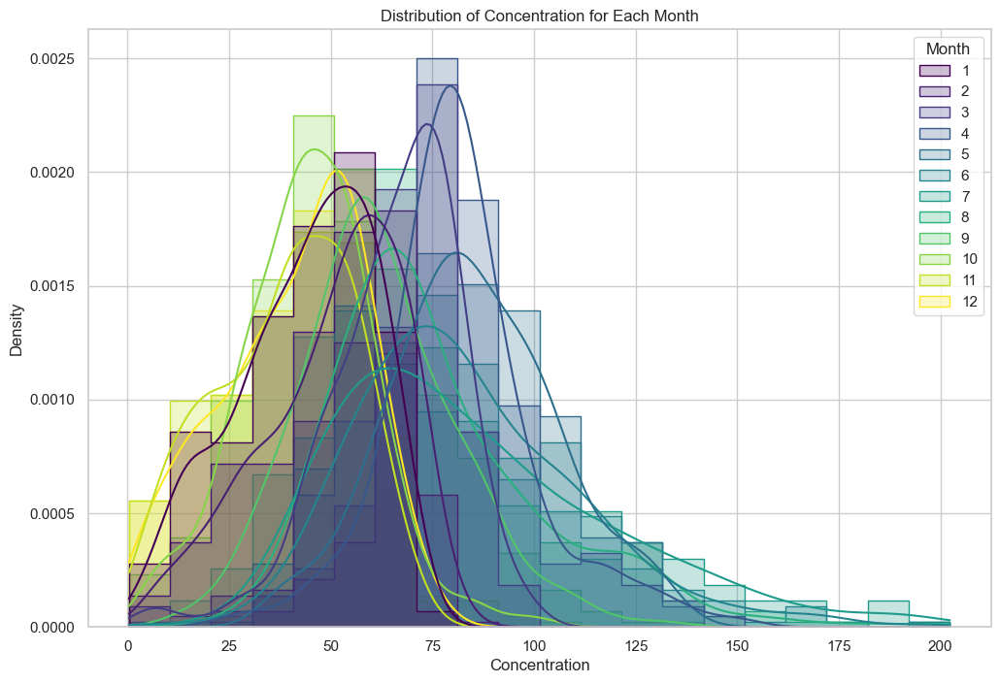

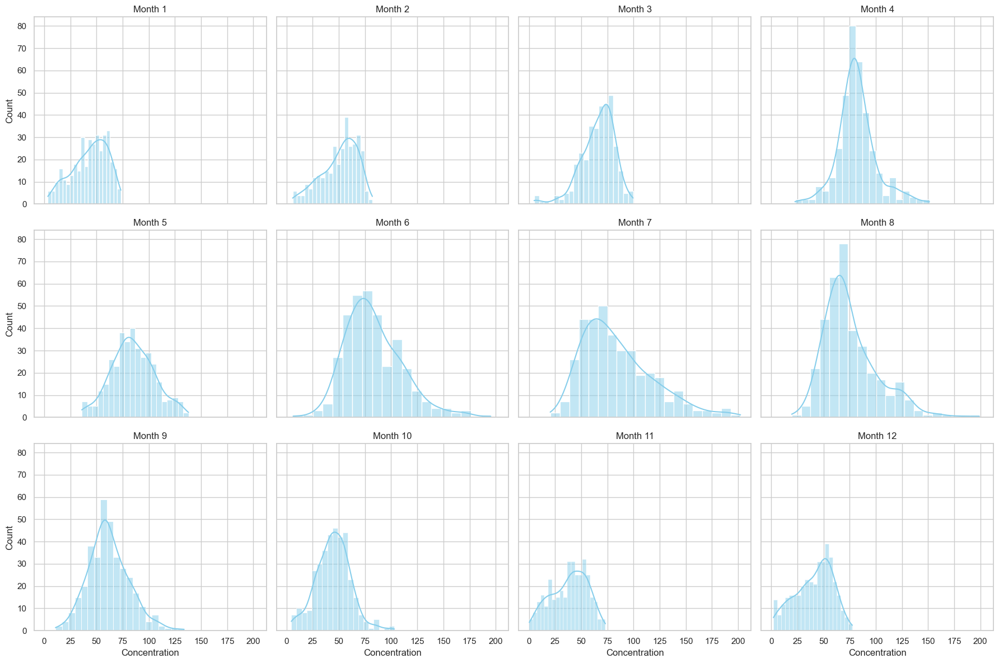

In [66]:
### Checking the distribution

# Setting the style for better visualization
sns.set(style="whitegrid")

# Plotting histograms for each month
plt.figure(figsize=(12, 8))
sns.histplot(data, x='Concentration', hue='Month', bins=20, kde=True, palette='viridis', element='step', stat='density')
plt.title('Distribution of Concentration for Each Month')
plt.xlabel('Concentration')
plt.ylabel('Density')
plt.show()


# Setting the style for better visualization
sns.set(style="whitegrid")

# Create subplots for each month
fig, axes = plt.subplots(3, 4, figsize=(18, 12), sharex=True, sharey=True)

# Flatten the axes for easier indexing
axes = axes.flatten()

# Plot histograms for each month
for i, (month, group) in enumerate(data.groupby('Month')):
    sns.histplot(group['Concentration'], bins=20, kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Month {month}')

# Adjust layout
plt.tight_layout()
plt.show()

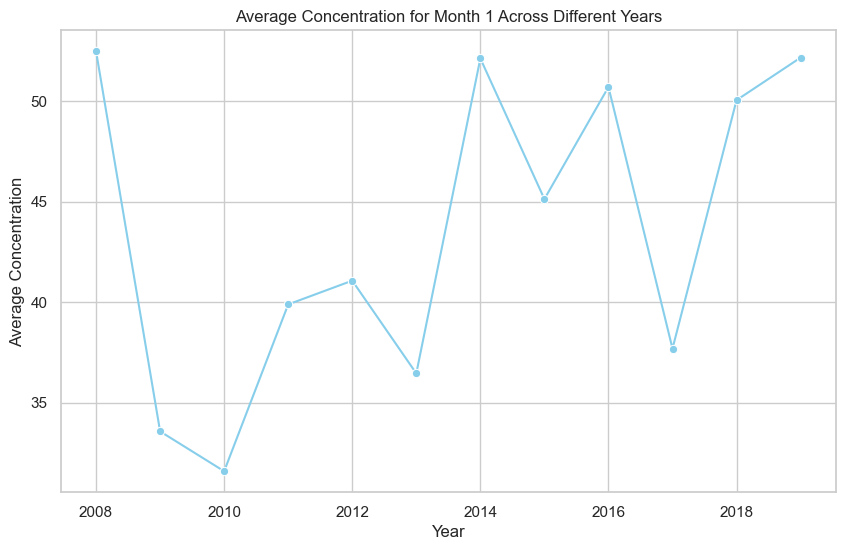

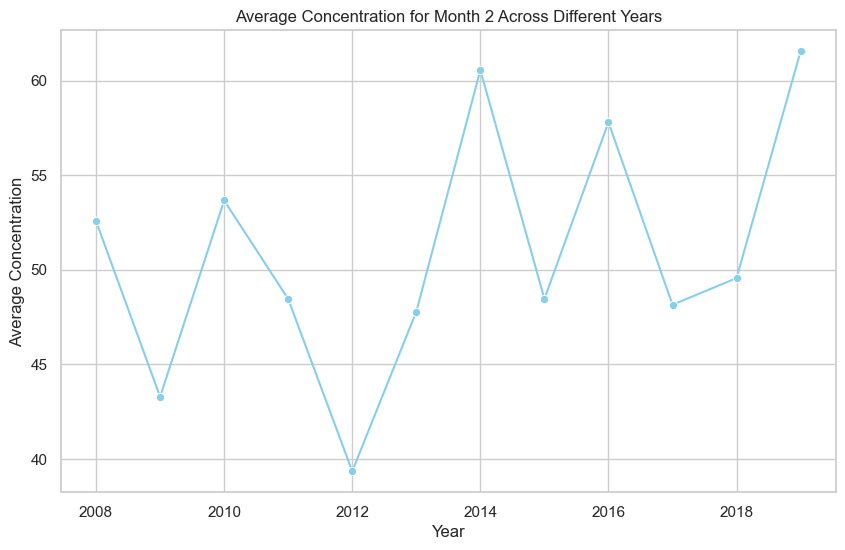

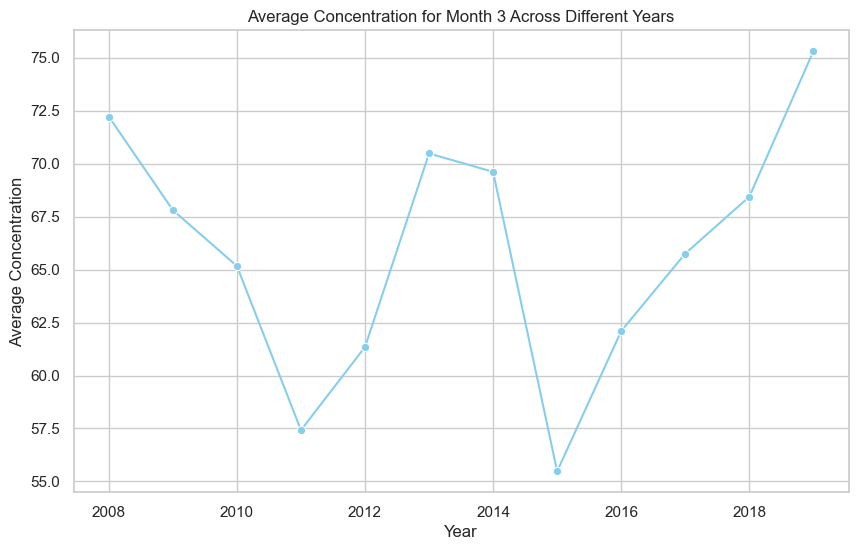

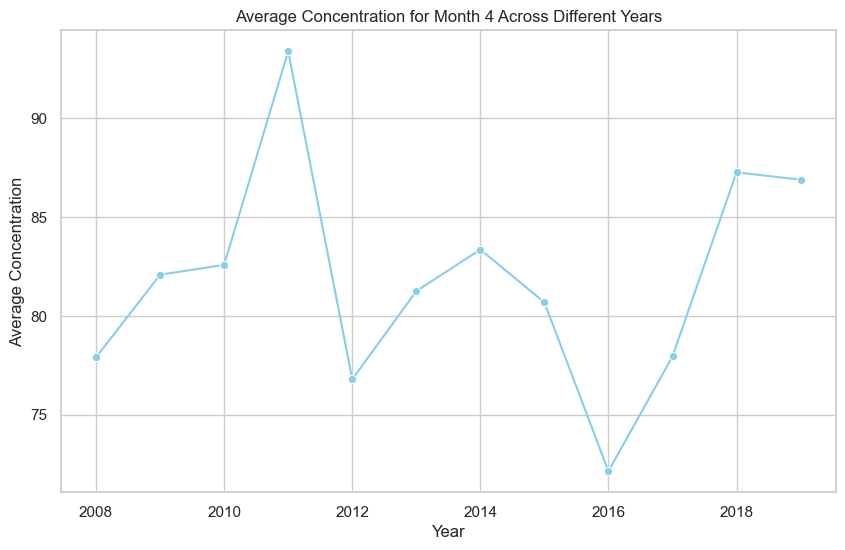

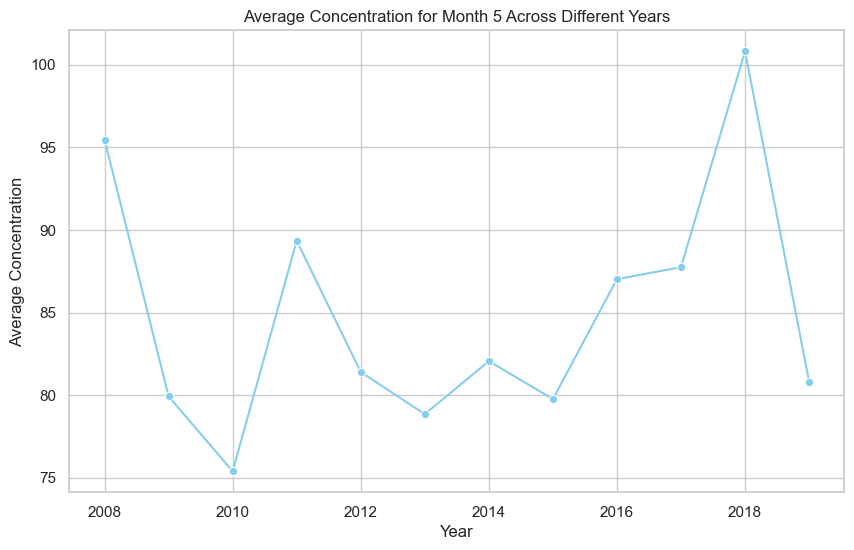

...

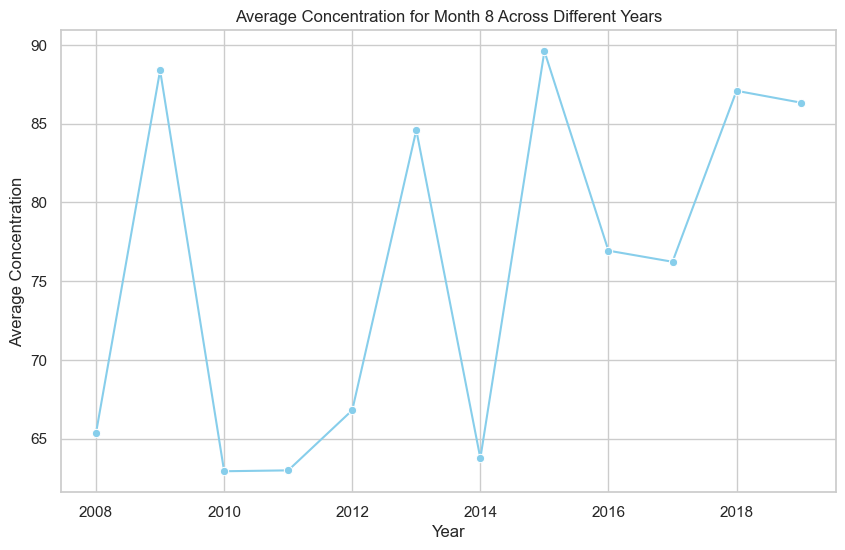

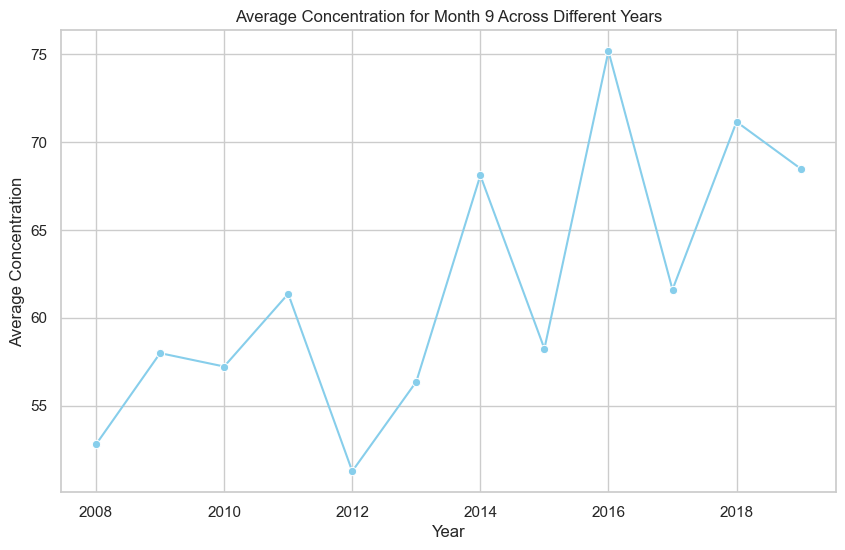

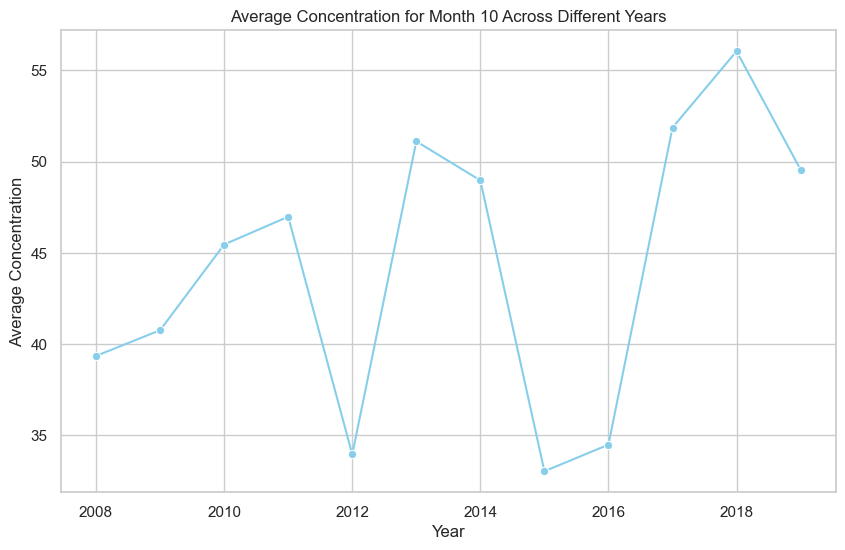

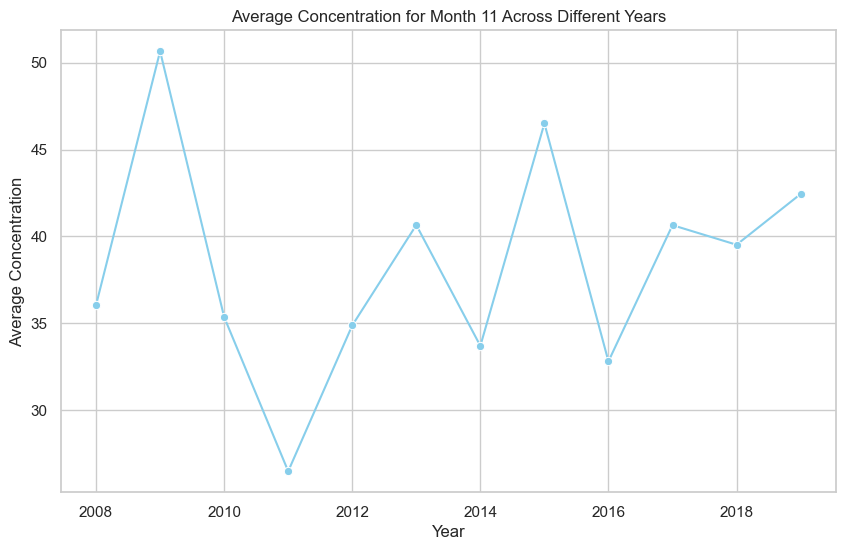

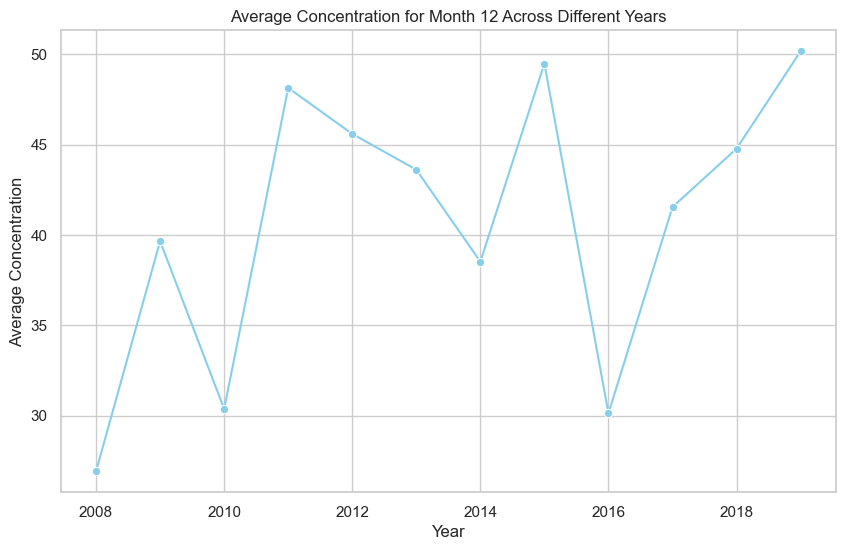

In [78]:
### How months change every year with time series

# Group the data by Year and Month and calculate the mean concentration for each combination
monthly_avg_concentration = data.groupby(['Year', 'Month'])['Concentration'].mean().reset_index()

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create separate line plots for each month
for month in range(1, 13):
    month_data = monthly_avg_concentration[monthly_avg_concentration['Month'] == month]
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='Year', y='Concentration', data=month_data, marker='o', color='skyblue')
    plt.title(f'Average Concentration for Month {month} Across Different Years')
    plt.xlabel('Year')
    plt.ylabel('Average Concentration')
    plt.show()

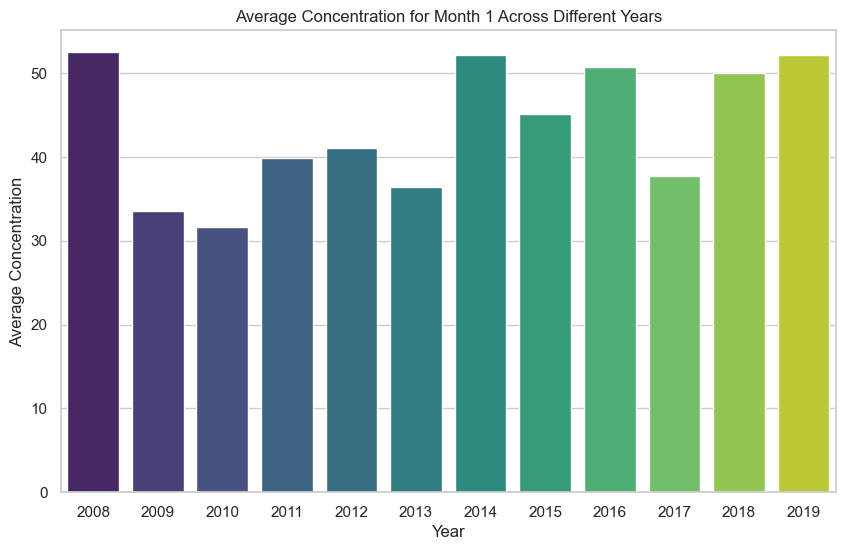

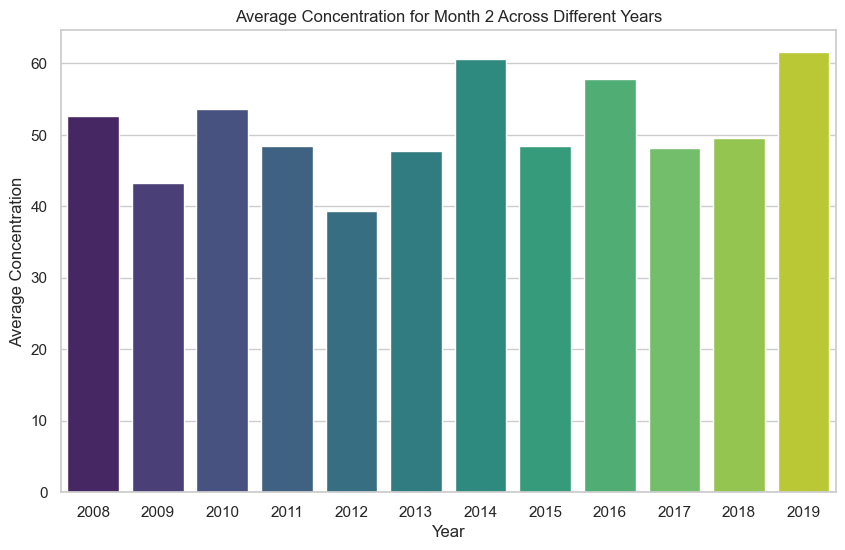

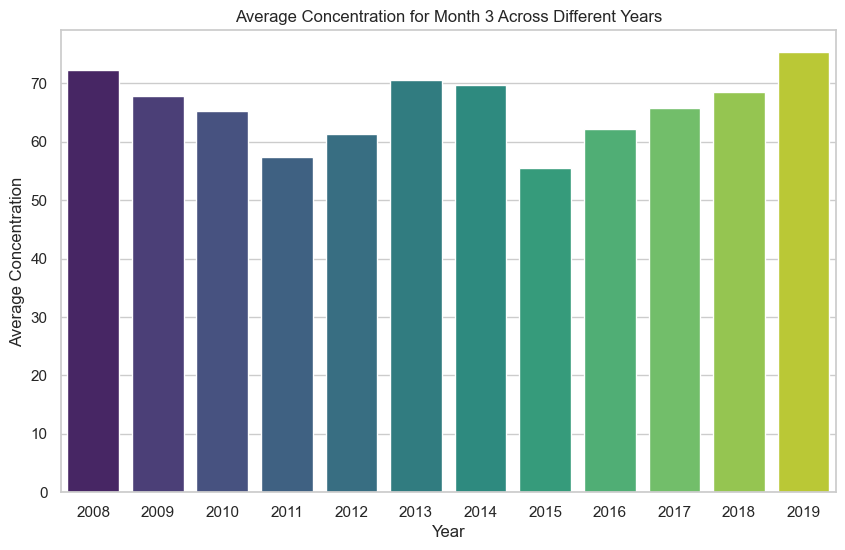

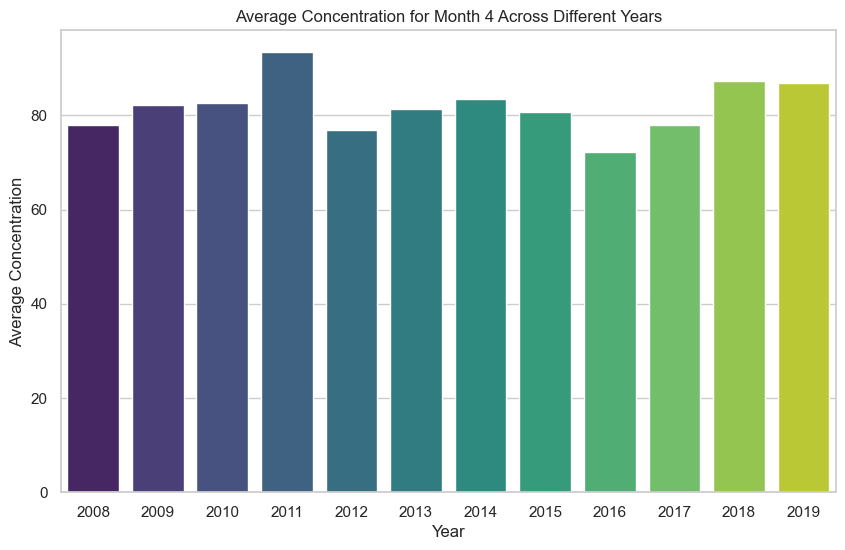

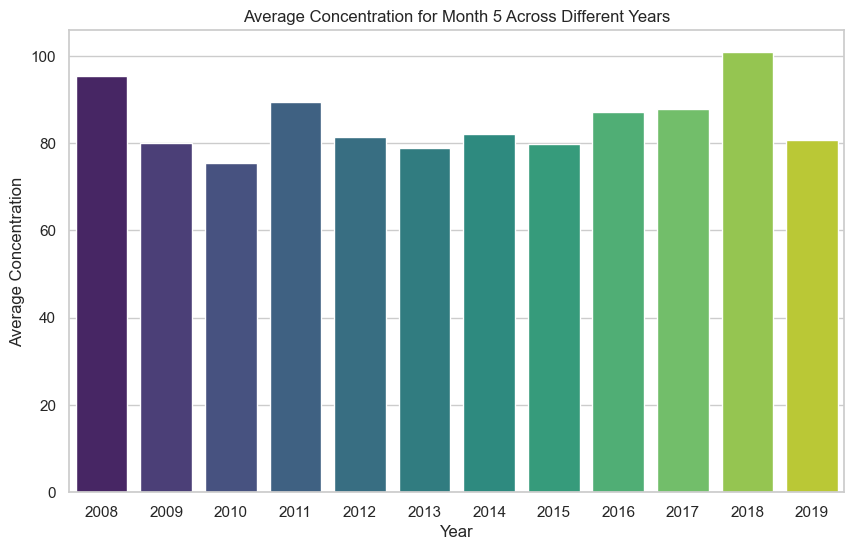

...

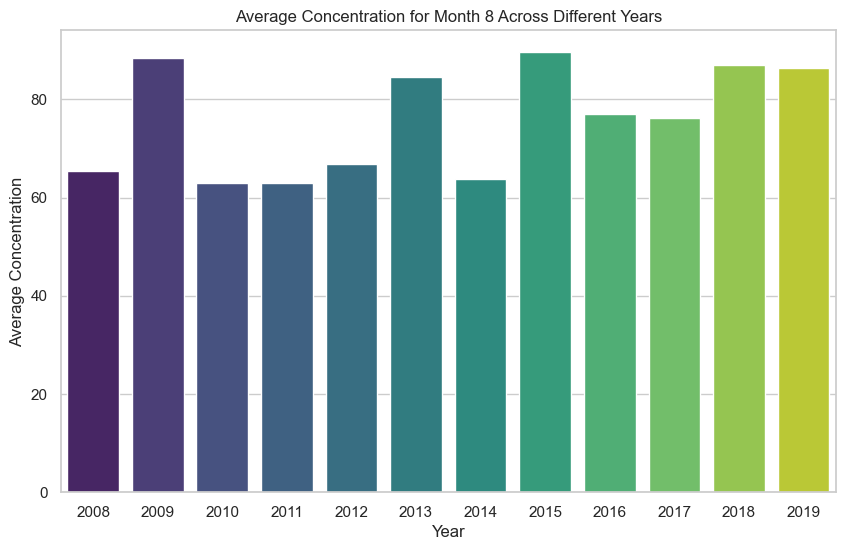

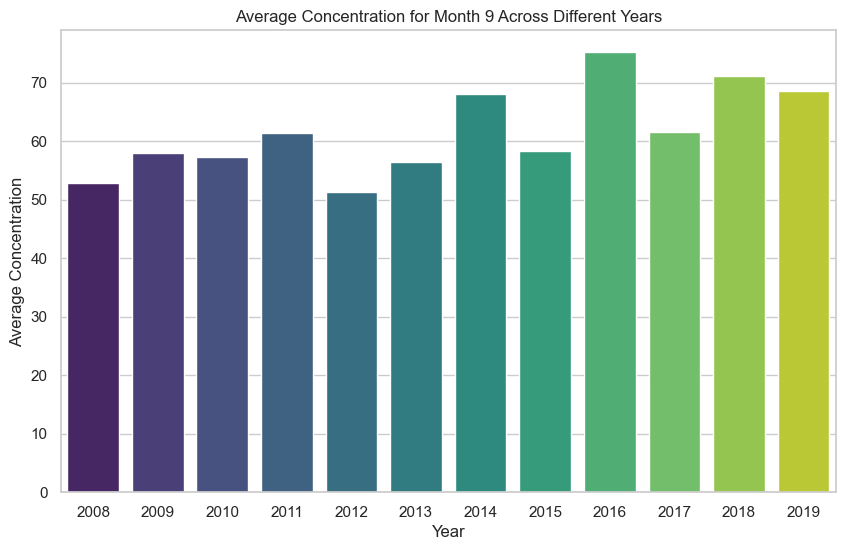

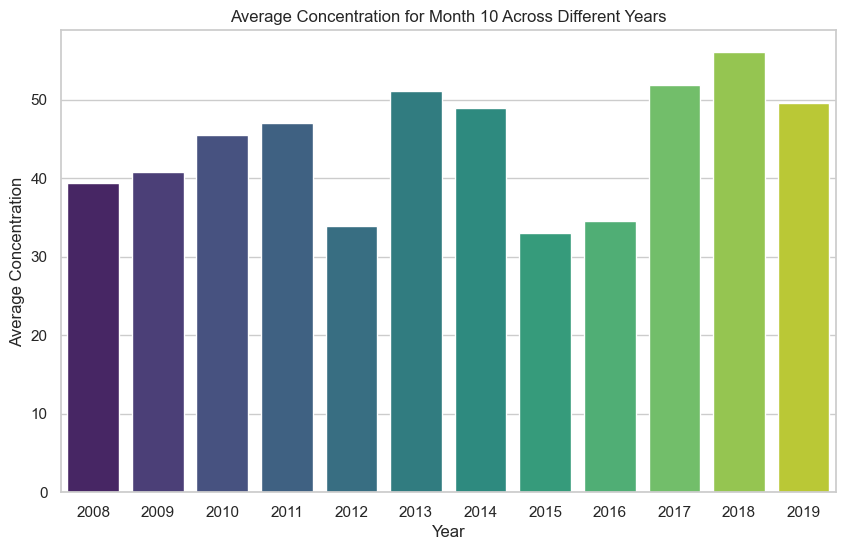

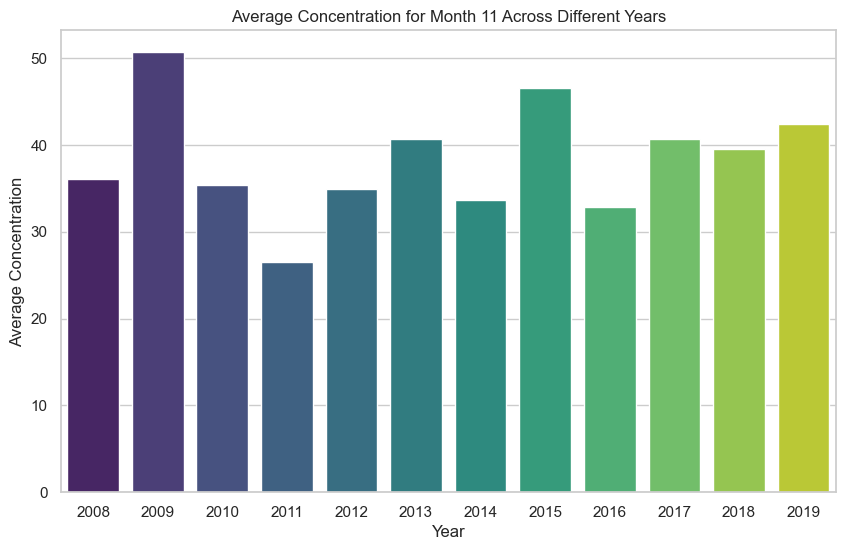

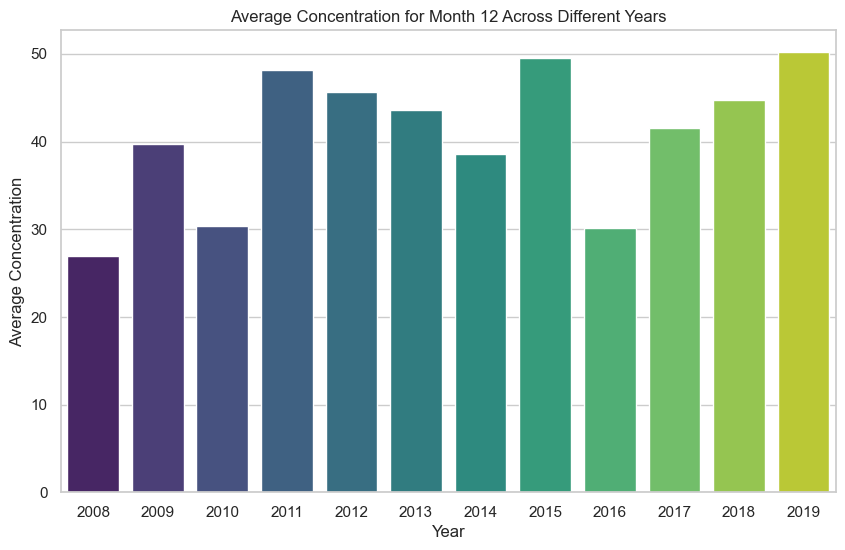

In [79]:
### How months change every year with bars

# Group the data by Year and Month and calculate the mean concentration for each combination
monthly_avg_concentration = data.groupby(['Year', 'Month'])['Concentration'].mean().reset_index()

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create separate bar graphs for each month
for month in range(1, 13):
    month_data = monthly_avg_concentration[monthly_avg_concentration['Month'] == month]
    
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Year', y='Concentration', data=month_data, palette='viridis')
    plt.title(f'Average Concentration for Month {month} Across Different Years')
    plt.xlabel('Year')
    plt.ylabel('Average Concentration')
    plt.show()

### Day 

In [68]:
# Summary statistics for the "Day" variable
summary_statistics_day = data['Day'].describe()
print(summary_statistics_day)

count    4354.000000
mean       15.740239
std         8.814618
min         1.000000
25%         8.000000
50%        16.000000
75%        23.000000
max        31.000000
Name: Day, dtype: float64


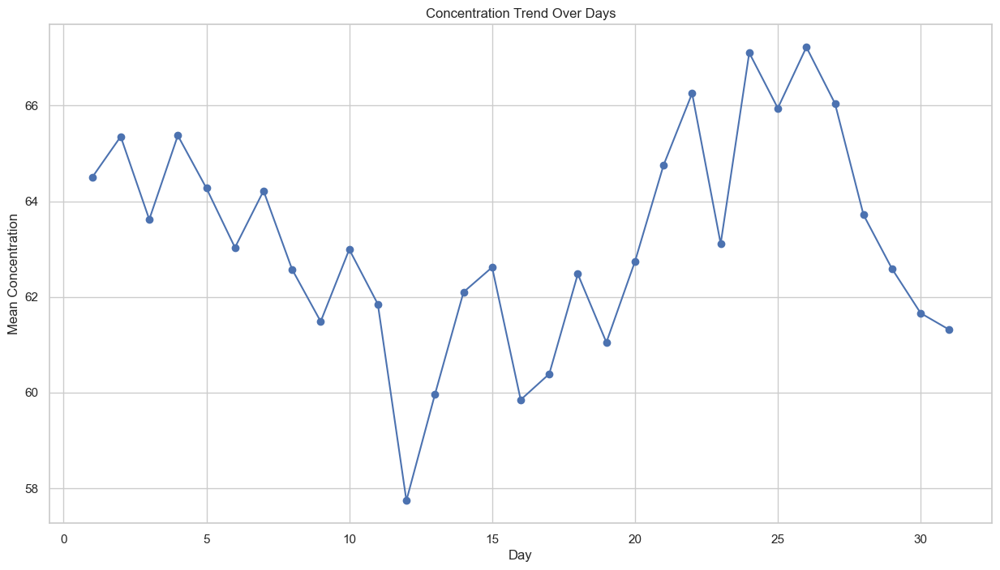

In [70]:
### Trend analysis:

# Group the data by Day and calculate the mean concentration for each day
trend_data_day = data.groupby('Day')['Concentration'].mean()

# Plotting the trend for each day
plt.figure(figsize=(15, 8))
plt.plot(trend_data_day.index, trend_data_day.values, marker='o', linestyle='-')
plt.title('Concentration Trend Over Days')
plt.xlabel('Day')
plt.ylabel('Mean Concentration')
plt.grid(True)
plt.show()

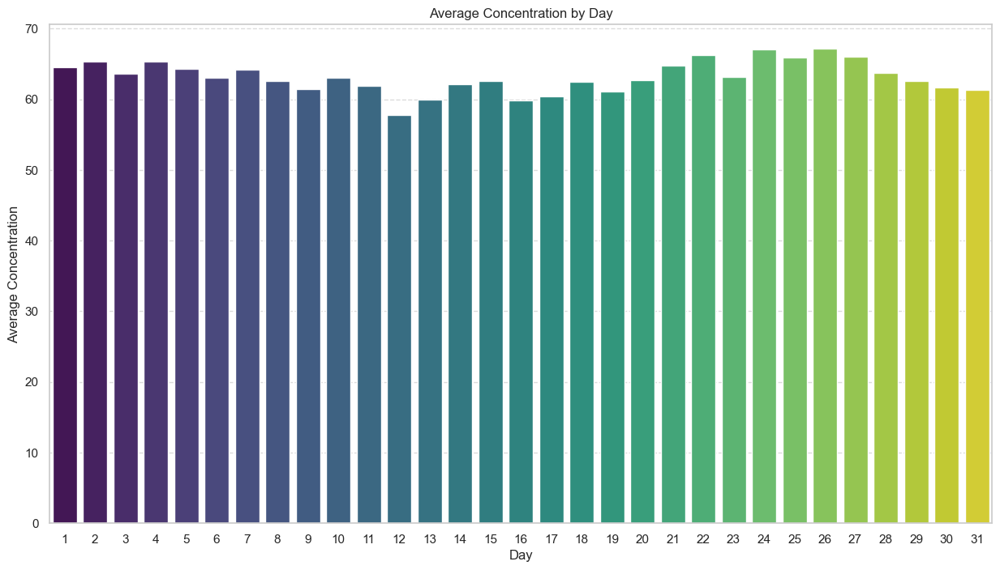

In [71]:
### Bar graph of each day

# Group the data by Day and calculate the mean concentration for each day
daily_concentration = data.groupby('Day')['Concentration'].mean()

# Plotting the bar graph
plt.figure(figsize=(15, 8))
sns.barplot(x=daily_concentration.index, y=daily_concentration.values, palette='viridis')
plt.title('Average Concentration by Day')
plt.xlabel('Day')
plt.ylabel('Average Concentration')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

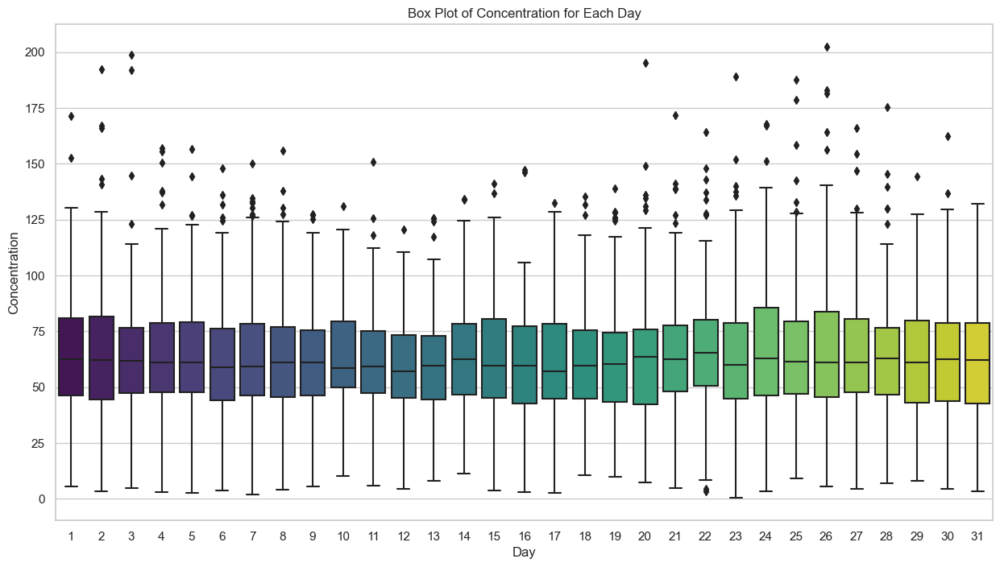

In [74]:
### Box plot of each day

# Setting the style for better visualization
sns.set(style="whitegrid")

# Plotting box plots for each day
plt.figure(figsize=(15, 8))
sns.boxplot(x='Day', y='Concentration', data=data, palette='viridis')
plt.title('Box Plot of Concentration for Each Day')
plt.xlabel('Day')
plt.ylabel('Concentration')
plt.show()

In [73]:
### Which day has the most outliers

# Calculate Z-scores for Concentration within each day
data['Z_score_day'] = data.groupby('Day')['Concentration'].transform(lambda x: (x - x.mean()) / x.std())

# Define a threshold for considering points as outliers (e.g., Z-score > 3 or < -3)
outlier_threshold_day = 3

# Identify and count outliers for each day
outliers_by_day = data.groupby('Day')['Z_score_day'].apply(lambda x: (abs(x) > outlier_threshold_day).sum()).reset_index()
outliers_by_day.columns = ['Day', 'Number_of_Outliers']

# Print the result
print(outliers_by_day)

    Day  Number_of_Outliers
0     1                   2
1     2                   3
2     3                   2
3     4                   2
4     5                   1
5     6                   1
6     7                   0
7     8                   1
8     9                   0
9    10                   0
10   11                   1
11   12                   0
12   13                   0
13   14                   0
14   15                   1
15   16                   2
16   17                   0
17   18                   0
18   19                   1
19   20                   2
20   21                   1
21   22                   1
22   23                   1
23   24                   2
24   25                   2
25   26                   3
26   27                   1
27   28                   1
28   29                   1
29   30                   1
30   31                   0


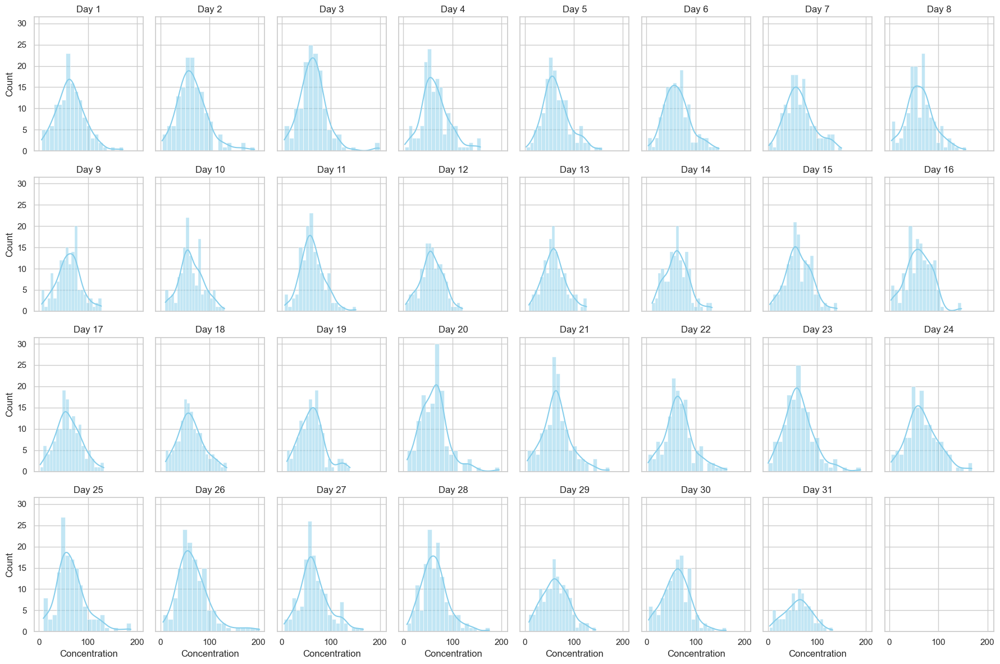

In [75]:
### Distribution of day

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create subplots for each day
fig, axes = plt.subplots(4, 8, figsize=(18, 12), sharex=True, sharey=True)

# Flatten the axes for easier indexing
axes = axes.flatten()

# Plot histograms for each day
for i, (day, group) in enumerate(data.groupby('Day')):
    sns.histplot(group['Concentration'], bins=20, kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Day {day}')

# Adjust layout
plt.tight_layout()
plt.show()

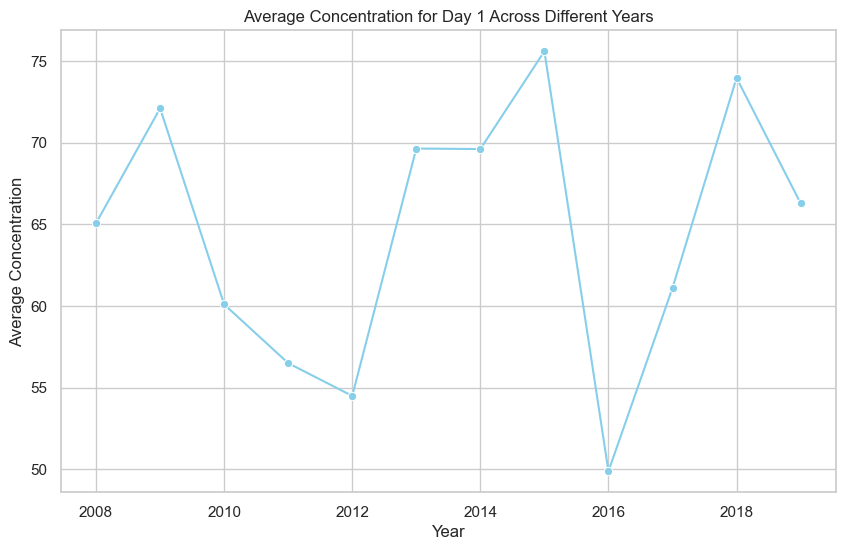

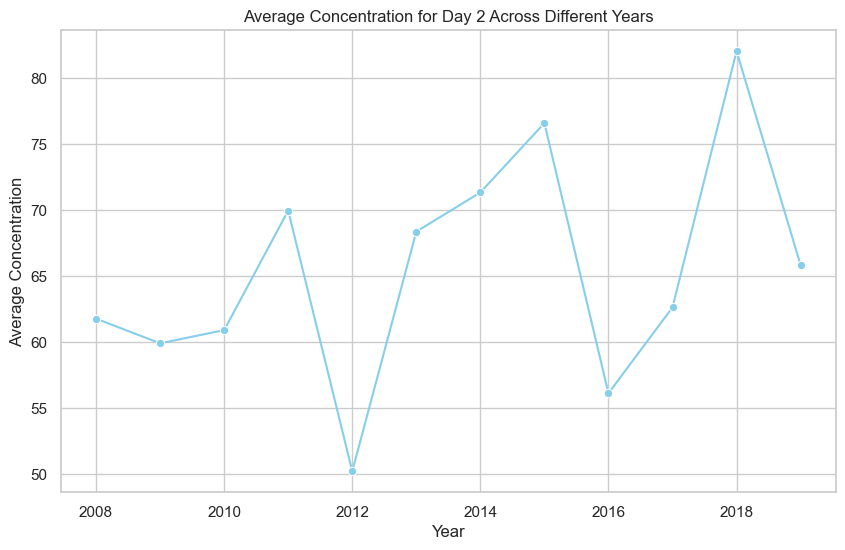

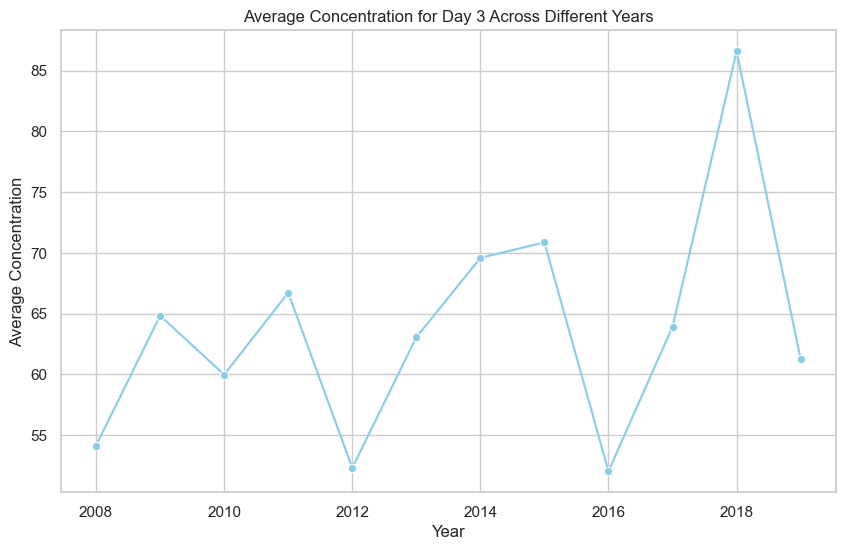

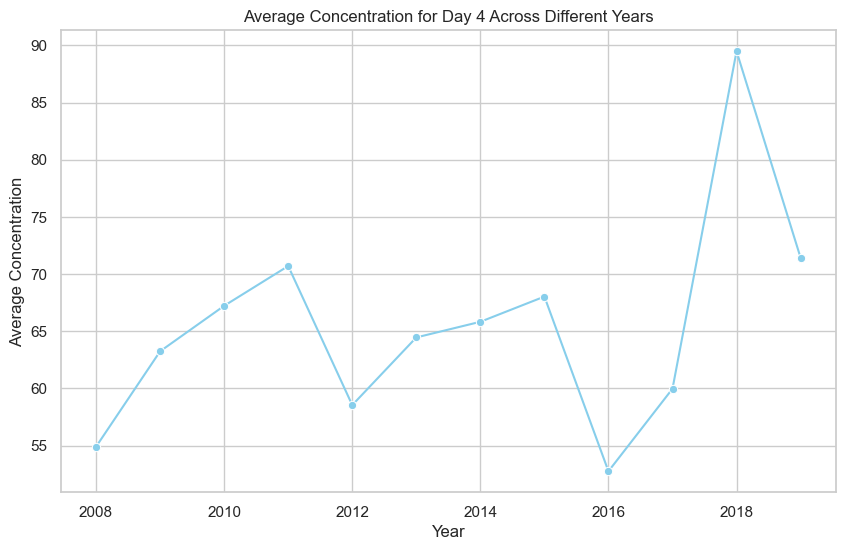

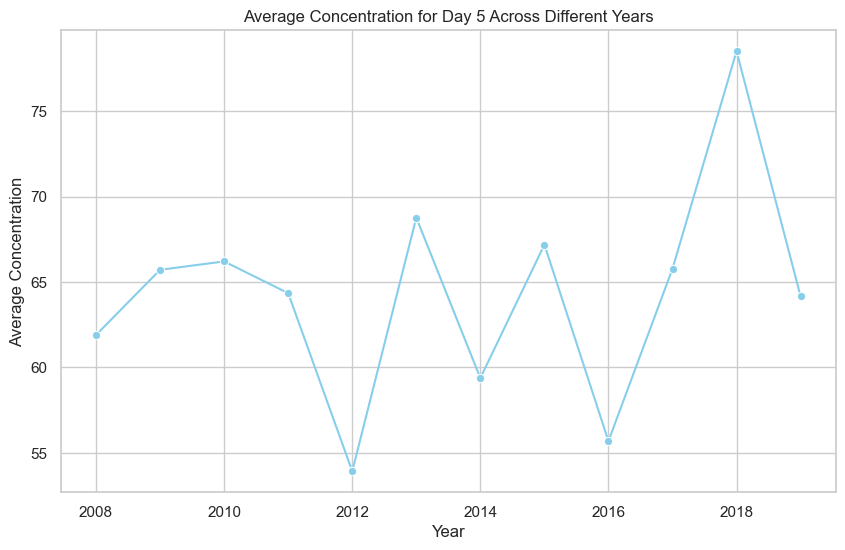

...

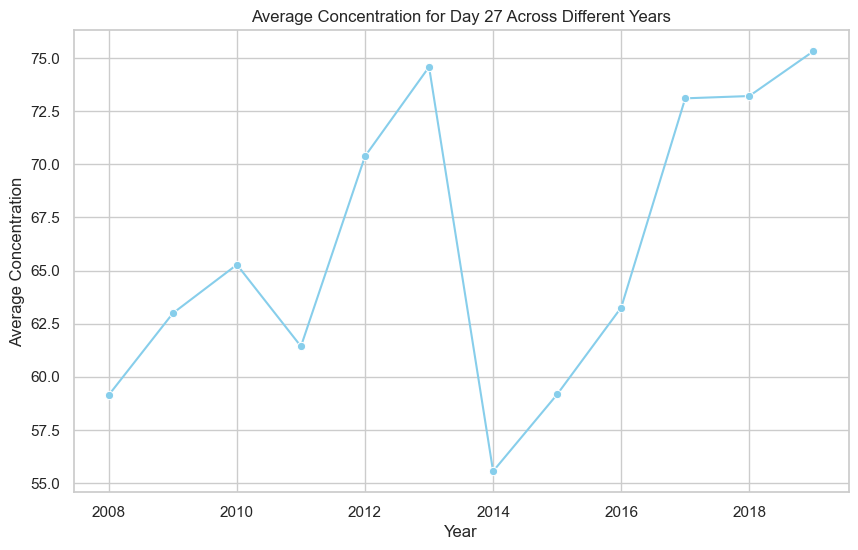

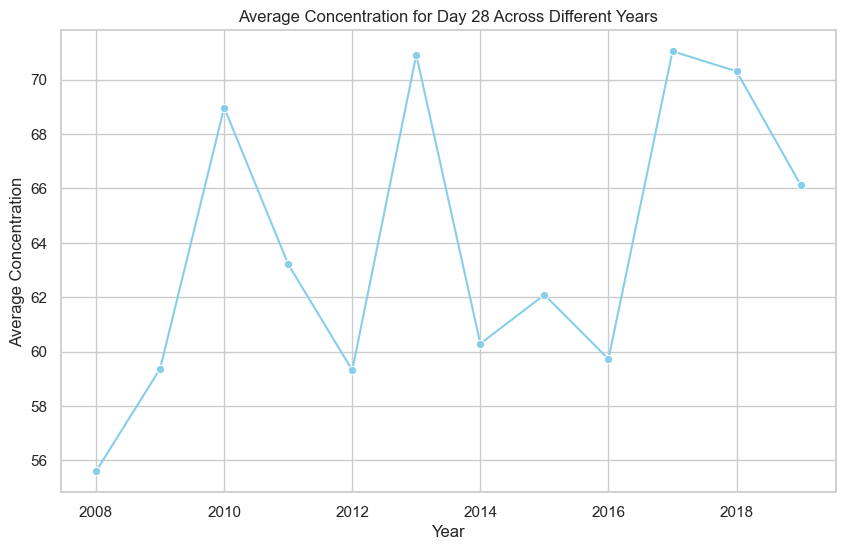

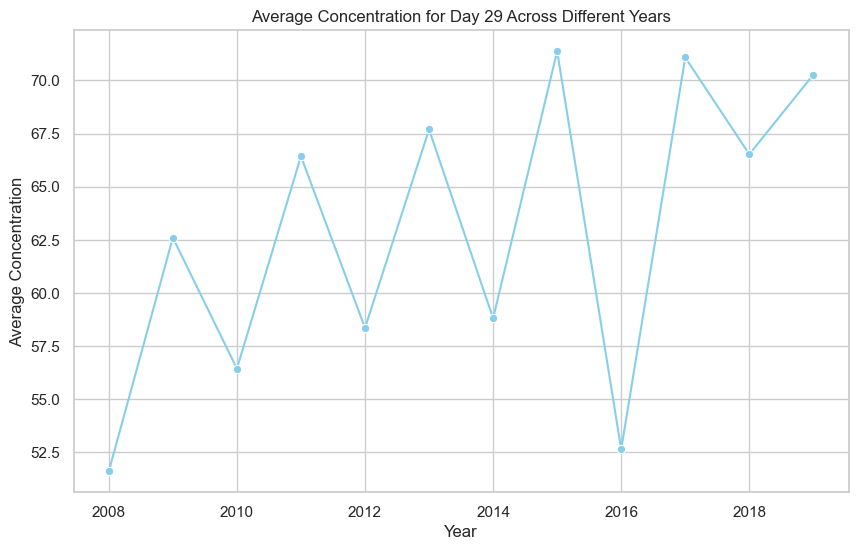

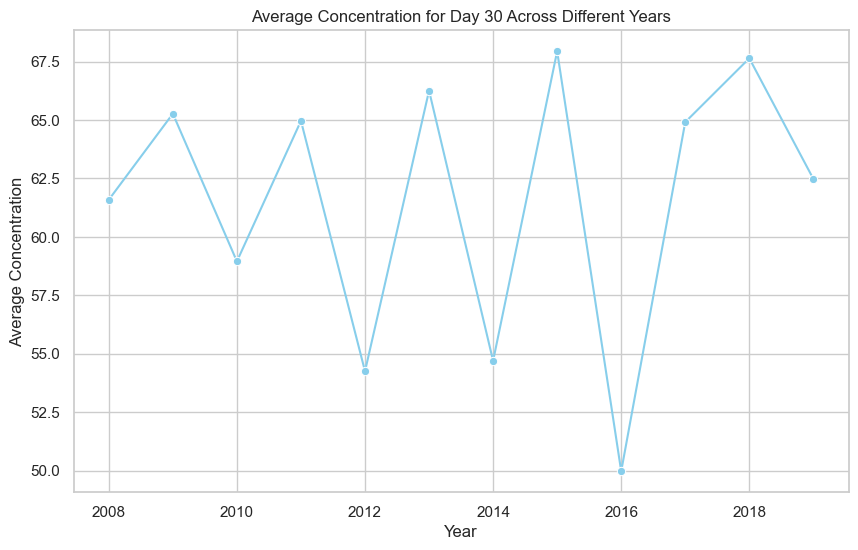

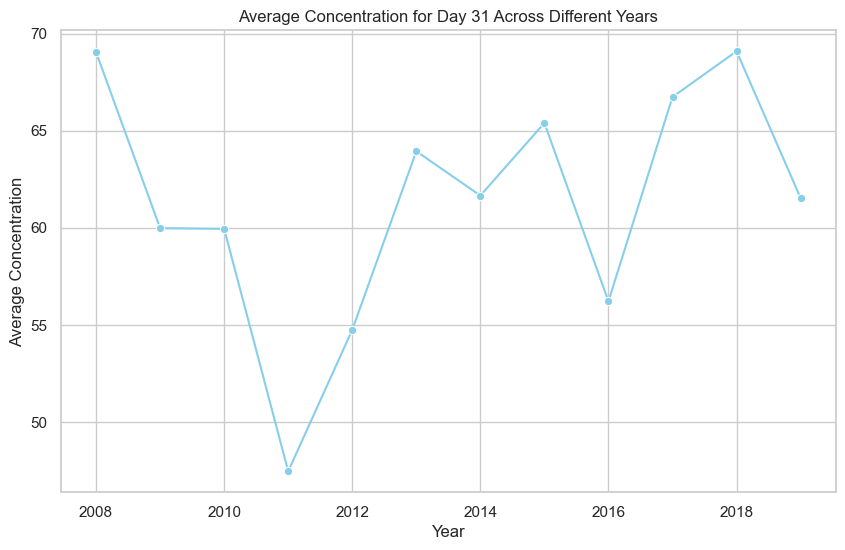

In [80]:
### How months change every year with time series

# Group the data by Year and Day and calculate the mean concentration for each combination
daily_avg_concentration = data.groupby(['Year', 'Day'])['Concentration'].mean().reset_index()

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create separate line plots for each day
for day in range(1, 32):
    day_data = daily_avg_concentration[daily_avg_concentration['Day'] == day]
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='Year', y='Concentration', data=day_data, marker='o', color='skyblue')
    plt.title(f'Average Concentration for Day {day} Across Different Years')
    plt.xlabel('Year')
    plt.ylabel('Average Concentration')
    plt.show()

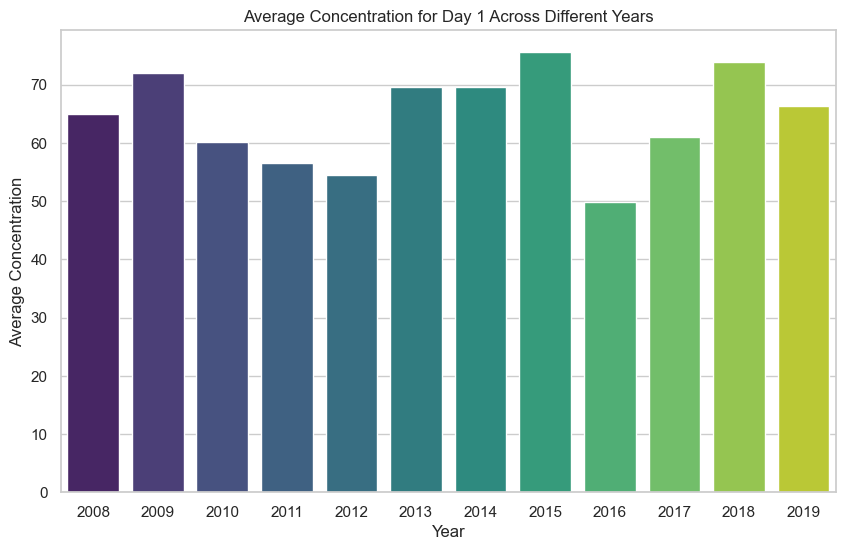

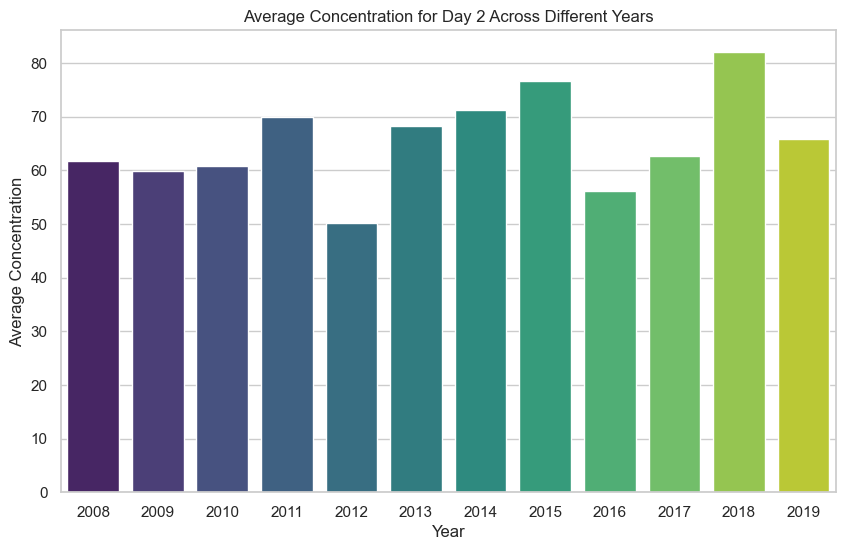

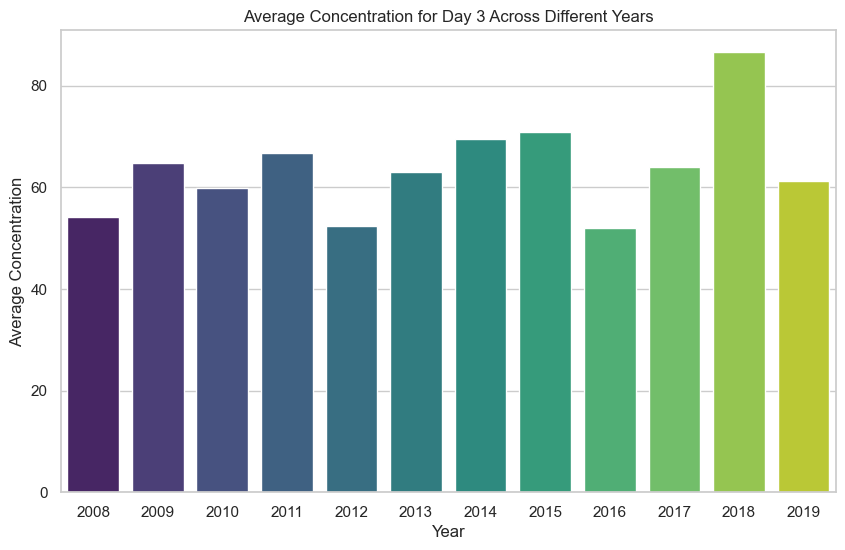

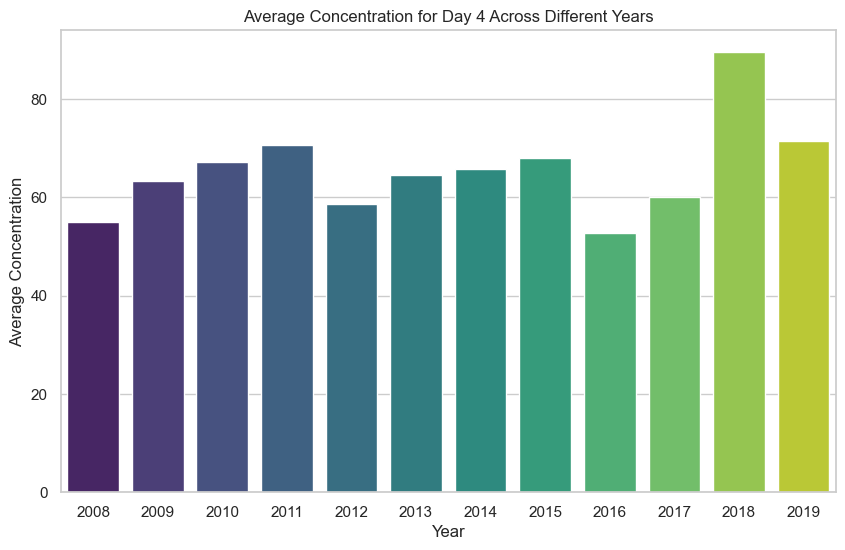

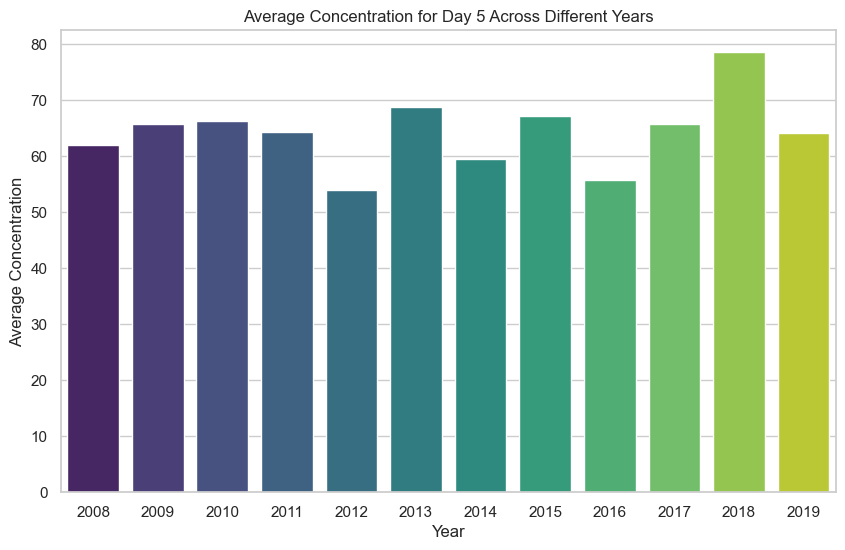

...

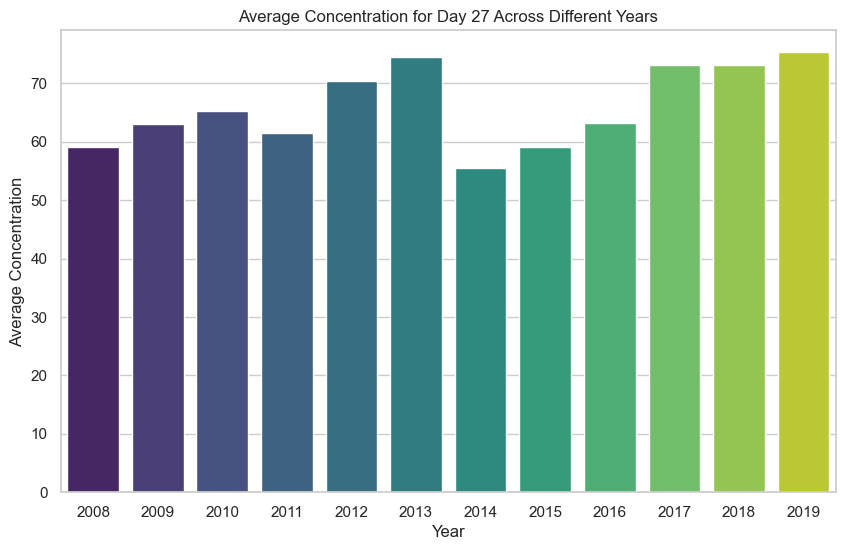

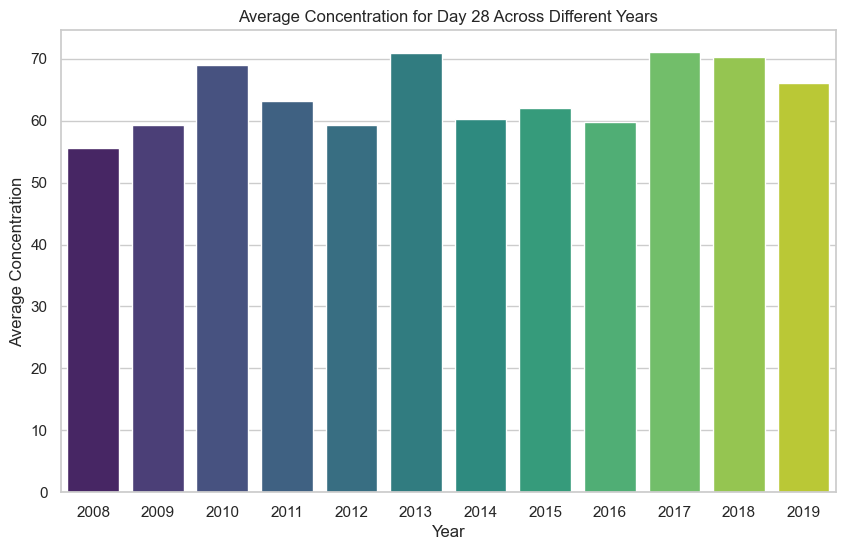

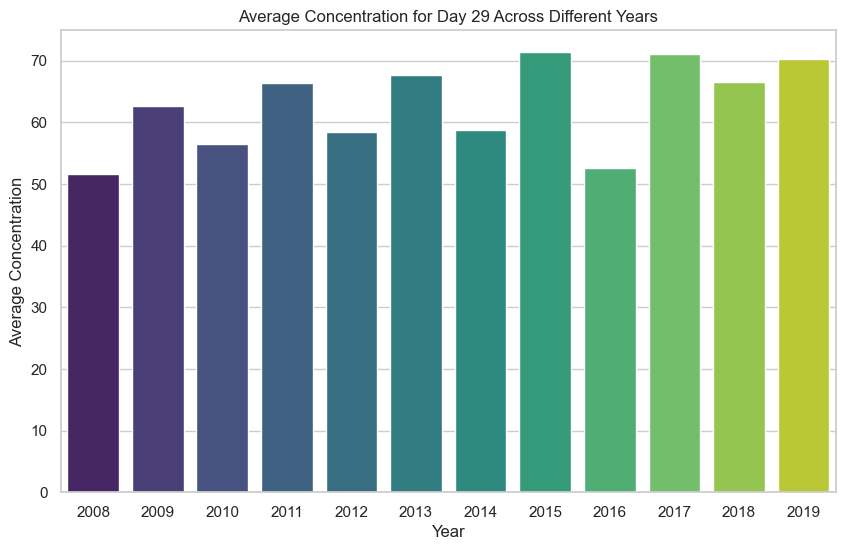

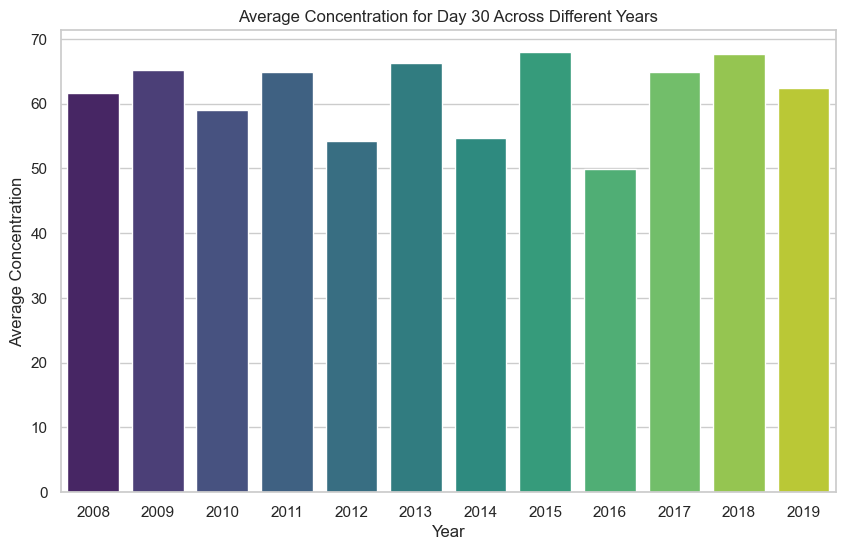

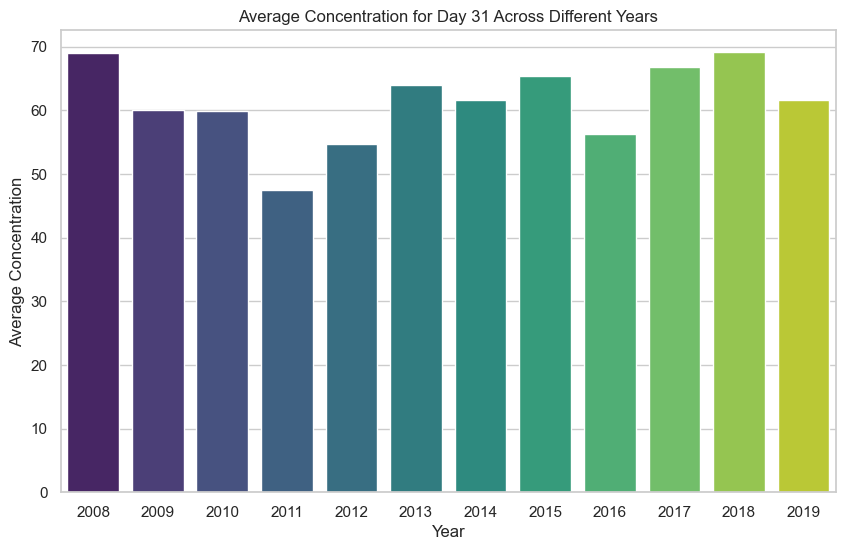

In [81]:
### How months change every year with bars

# Group the data by Year and Day and calculate the mean concentration for each combination
daily_avg_concentration = data.groupby(['Year', 'Day'])['Concentration'].mean().reset_index()

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create separate bar graphs for each day
for day in range(1, 32):
    day_data = daily_avg_concentration[daily_avg_concentration['Day'] == day]
    
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Year', y='Concentration', data=day_data, palette='viridis')
    plt.title(f'Average Concentration for Day {day} Across Different Years')
    plt.xlabel('Year')
    plt.ylabel('Average Concentration')
    plt.show()

### Day Of The Week

In [83]:
# Summary statistics for the "DayOfWeek" variable
summary_statistics_dayofweek = data['DayOfWeek'].describe()
print(summary_statistics_dayofweek)

count    4354.000000
mean        3.001148
std         2.002353
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
max         6.000000
Name: DayOfWeek, dtype: float64


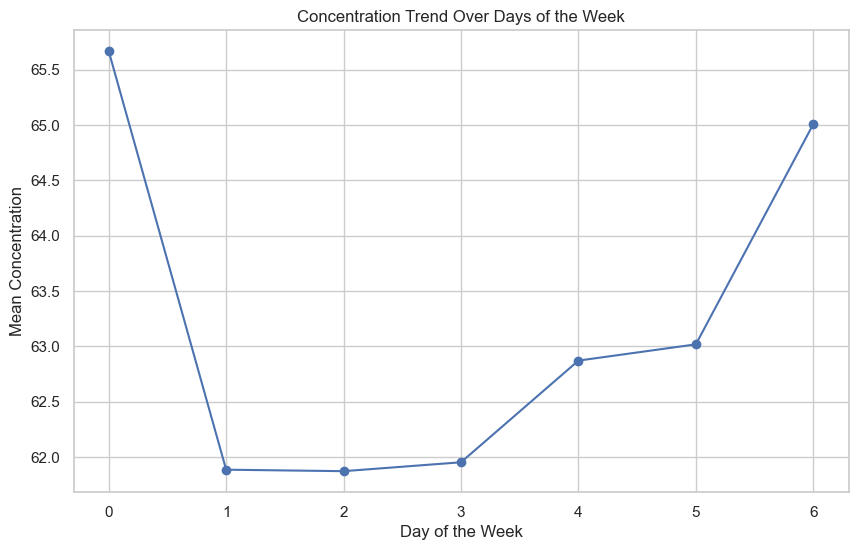

In [84]:
### Trend analysis

# Group the data by DayOfWeek and calculate the mean concentration for each day
trend_data_dayofweek = data.groupby('DayOfWeek')['Concentration'].mean()

# Plotting the trend for each day of the week
plt.figure(figsize=(10, 6))
plt.plot(trend_data_dayofweek.index, trend_data_dayofweek.values, marker='o', linestyle='-')
plt.title('Concentration Trend Over Days of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Mean Concentration')
plt.grid(True)
plt.show()

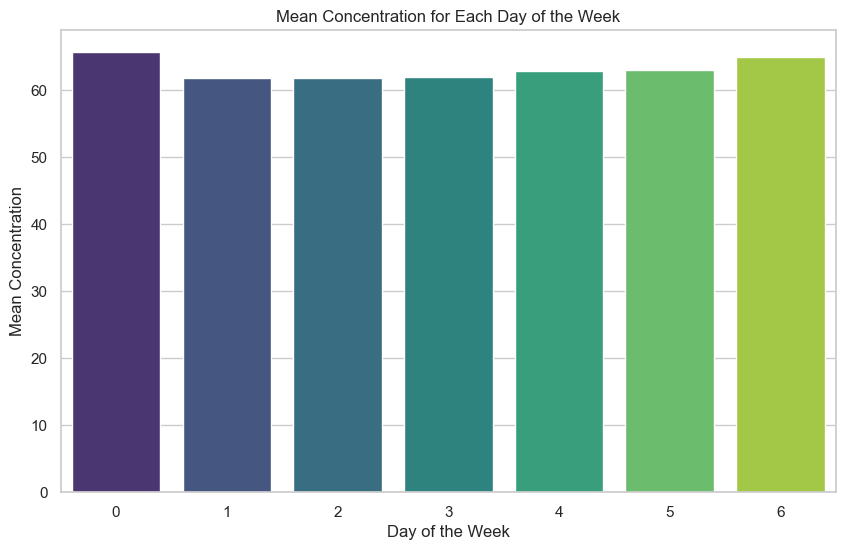

In [92]:
### Bar chart of days of the week and concentration

# Group the data by DayOfWeek and calculate the mean concentration for each day
trend_data_dayofweek = data.groupby('DayOfWeek')['Concentration'].mean()

# Setting the style for better visualization
sns.set(style="whitegrid")

# Plotting the trend for each day of the week using a bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=trend_data_dayofweek.index, y=trend_data_dayofweek.values, palette='viridis')
plt.title('Mean Concentration for Each Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Mean Concentration')
plt.show()

In [97]:
### Box plot

# Calculate Z-scores for Concentration within each day of the week
data['Z_score_dayofweek'] = data.groupby('DayOfWeek')['Concentration'].transform(lambda x: (x - x.mean()) / x.std())

# Define a threshold for considering points as outliers (e.g., Z-score > 3 or < -3)
outlier_threshold_dayofweek = 3

# Identify and count outliers for each day of the week
outliers_by_dayofweek = data.groupby('DayOfWeek')['Z_score_dayofweek'].apply(lambda x: (abs(x) > outlier_threshold_dayofweek).sum()).reset_index()
outliers_by_dayofweek.columns = ['DayOfWeek', 'Number_of_Outliers']

# Print the result
print(outliers_by_dayofweek)

   DayOfWeek  Number_of_Outliers
0          0                   6
1          1                   4
2          2                   2
3          3                   6
4          4                   8
5          5                   7
6          6                   6


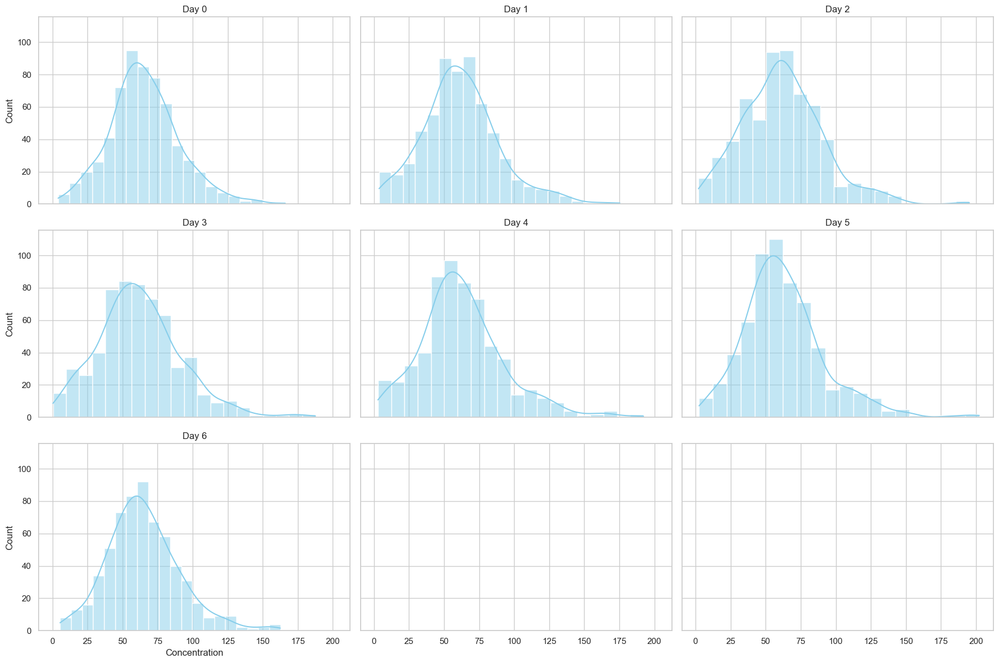

In [100]:
### Distribution of each day

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create subplots for each day
fig, axes = plt.subplots(3, 3, figsize=(18, 12), sharex=True, sharey=True)

# Flatten the axes for easier indexing
axes = axes.flatten()

# Plot histograms for each day
for i, (day, group) in enumerate(data.groupby('DayOfWeek')):
    sns.histplot(group['Concentration'], bins=20, kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Day {day}')

# Adjust layout
plt.tight_layout()
plt.show()

In [96]:
### Which value has the most outliers

# Calculate Z-scores for Concentration within each day
data['Z_score_day'] = data.groupby('Day')['Concentration'].transform(lambda x: (x - x.mean()) / x.std())

# Define a threshold for considering points as outliers (e.g., Z-score > 3 or < -3)
outlier_threshold_day = 3

# Identify and count outliers for each day
outliers_by_day = data.groupby('Day')['Z_score_day'].apply(lambda x: (abs(x) > outlier_threshold_day).sum()).reset_index()
outliers_by_day.columns = ['Day', 'Number_of_Outliers']

# Find the day with the most outliers
most_outliers_day = outliers_by_day.loc[outliers_by_day['Number_of_Outliers'].idxmax()]

# Print the result
print("Day with the Most Outliers:")
print(most_outliers_day)

Day with the Most Outliers:
Day                   2
Number_of_Outliers    3
Name: 1, dtype: int64


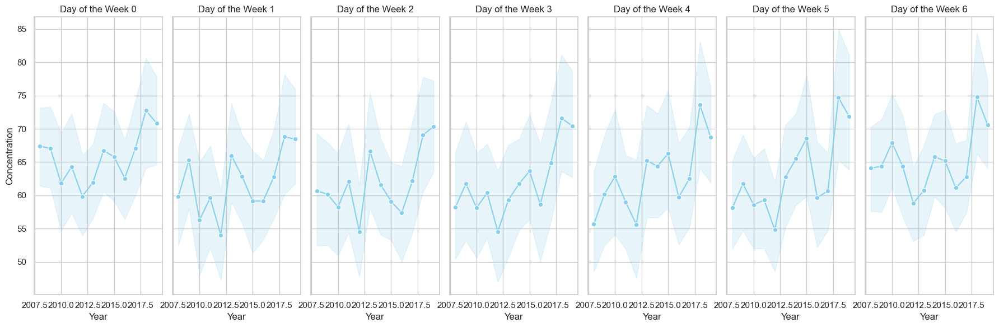

In [89]:
### How dayoftheweek change every year with time

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create subplots for each day of the week
fig, axes = plt.subplots(1, 7, figsize=(18, 6), sharex=True, sharey=True)

# Flatten the axes for easier indexing
axes = axes.flatten()

# Plot line graphs for each year with respect to each day of the week
for dayofweek in range(0, 7):
    dayofweek_data = data[data['DayOfWeek'] == dayofweek]
    
    sns.lineplot(x='Year', y='Concentration', data=dayofweek_data, ax=axes[dayofweek], marker='o', color='skyblue')
    axes[dayofweek].set_title(f'Day of the Week {dayofweek}')

# Adjust layout
plt.tight_layout()
plt.show()

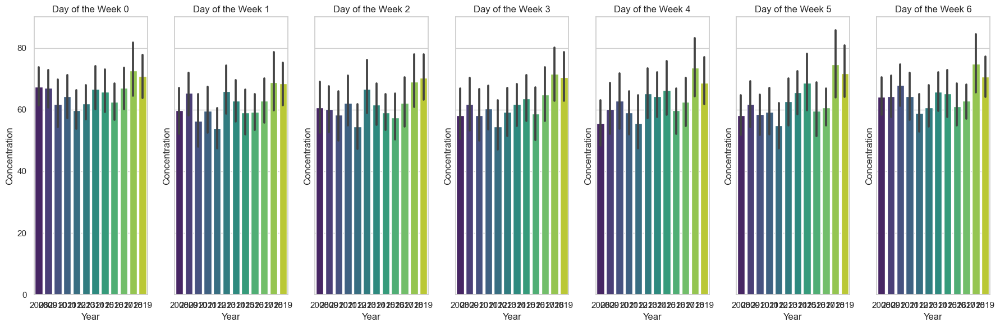

In [90]:
### How dayoftheweek change every year with bars

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create subplots for each day of the week
fig, axes = plt.subplots(1, 7, figsize=(18, 6), sharex=True, sharey=True)

# Flatten the axes for easier indexing
axes = axes.flatten()

# Plot bar graphs for each year with respect to each day of the week
for dayofweek in range(0, 7):
    dayofweek_data = data[data['DayOfWeek'] == dayofweek]
    
    sns.barplot(x='Year', y='Concentration', data=dayofweek_data, ax=axes[dayofweek], palette='viridis')
    axes[dayofweek].set_title(f'Day of the Week {dayofweek}')

# Adjust layout
plt.tight_layout()
plt.show()

### Weekend variable 

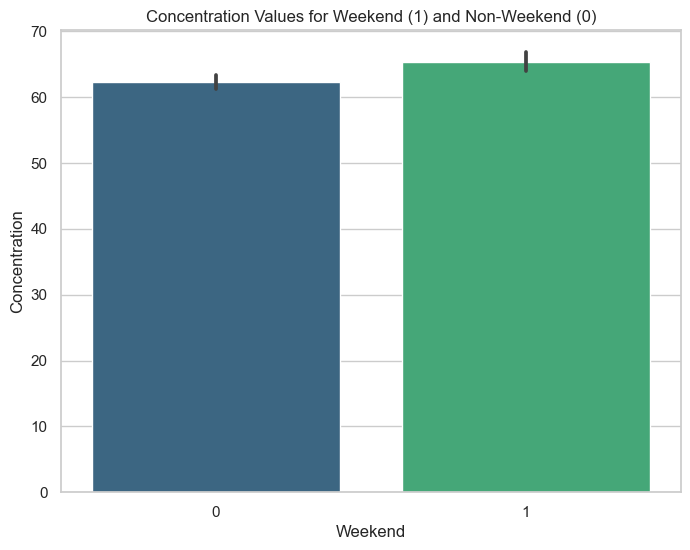

In [103]:
### Bar graph of concentration values for weekend or not

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create a bar graph for concentration values based on the 'Weekend' variable
plt.figure(figsize=(8, 6))
sns.barplot(x='Weekend', y='Concentration', data=data, palette='viridis')
plt.title('Concentration Values for Weekend (1) and Non-Weekend (0)')
plt.xlabel('Weekend')
plt.ylabel('Concentration')
plt.show()

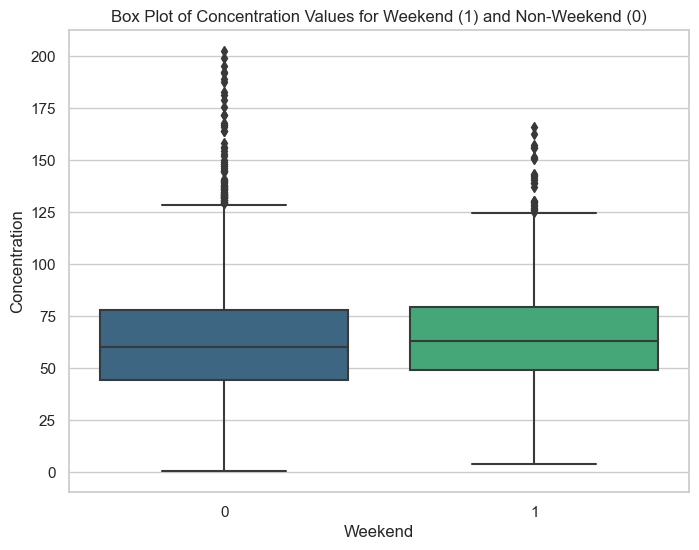

In [105]:
### Box plot

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create a box plot for concentration values based on the 'Weekend' variable
plt.figure(figsize=(8, 6))
sns.boxplot(x='Weekend', y='Concentration', data=data, palette='viridis')
plt.title('Box Plot of Concentration Values for Weekend (1) and Non-Weekend (0)')
plt.xlabel('Weekend')
plt.ylabel('Concentration')
plt.show()

In [106]:
### Calculating the number of outliers

# Calculate Z-scores for Concentration within each category of the 'Weekend' variable
data['Z_score_weekend'] = data.groupby('Weekend')['Concentration'].transform(lambda x: (x - x.mean()) / x.std())

# Define a threshold for considering points as outliers (e.g., Z-score > 3 or < -3)
outlier_threshold_weekend = 3

# Identify and count outliers for each category in the 'Weekend' variable
outliers_by_weekend = data.groupby('Weekend')['Z_score_weekend'].apply(lambda x: (abs(x) > outlier_threshold_weekend).sum()).reset_index()
outliers_by_weekend.columns = ['Weekend', 'Number_of_Outliers']

# Print the result
print(outliers_by_weekend)

   Weekend  Number_of_Outliers
0        0                  26
1        1                  12


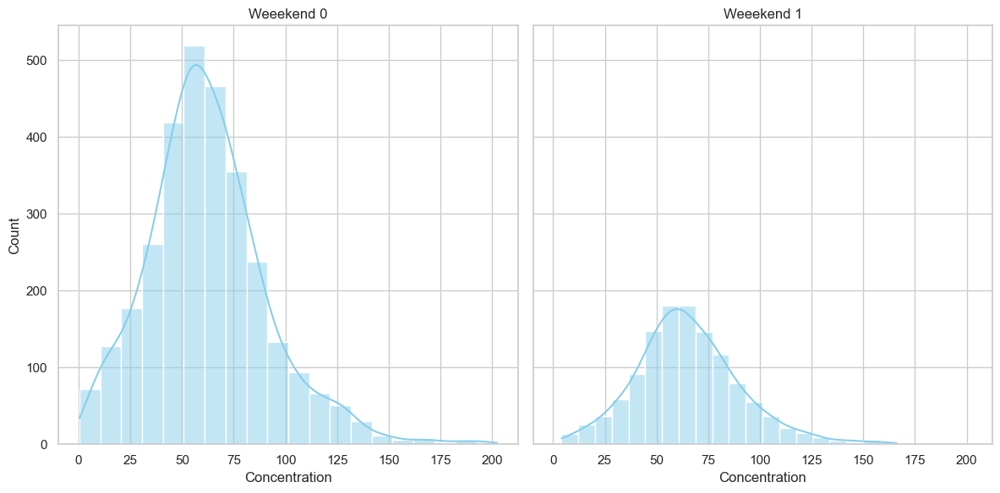

In [107]:
### Distribution of weekend or not

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create subplots for each category in the 'Weekend' variable
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

# Plot histograms for concentration values for each category in 'Weekend'
for i, (weekend_category, group) in enumerate(data.groupby('Weekend')):
    sns.histplot(group['Concentration'], bins=20, kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Weeekend {weekend_category}')

# Adjust layout
plt.tight_layout()
plt.show()

In [109]:
# List of columns to be removed
columns_to_remove = ['Z_score', 'Z_score_month', 'Z_score_day', 'Z_score_dayofweek', 'Z_score_weekend']

# Remove the specified columns from the 'data' DataFrame
data = data.drop(columns=columns_to_remove)

In [110]:
data.head()

,Year,Month,Day,Concentration,DayOfWeek,Weekend
Date,,,,,,
2008-01-01,2008,1,1,18.500,2,0
2008-01-02,2008,1,2,46.125,3,0
2008-01-03,2008,1,3,38.250,4,0
2008-01-04,2008,1,4,33.125,5,0
2008-01-05,2008,1,5,68.250,6,1


# **ARIMA model**

## A new variable based on the optimal SARIMA is made

In [111]:
### We first create a new dataset,interpolate the missing values so that we can perform ARIMA
# Assuming data is your DataFrame
data_a = data.copy()

In [112]:
data_a['Concentration'] = data_a['Concentration'].interpolate(method='linear')

In [113]:
# Assuming data_a is your DataFrame
columns_to_drop = ['Year', 'Month', 'Day', 'DayOfWeek', 'Weekend']

# Drop the specified columns from data_a
data_a = data_a.drop(columns=columns_to_drop)

data_a.isna().sum()
data_a.head()

,Concentration
Date,
2008-01-01,18.500
2008-01-02,46.125
2008-01-03,38.250
2008-01-04,33.125
2008-01-05,68.250


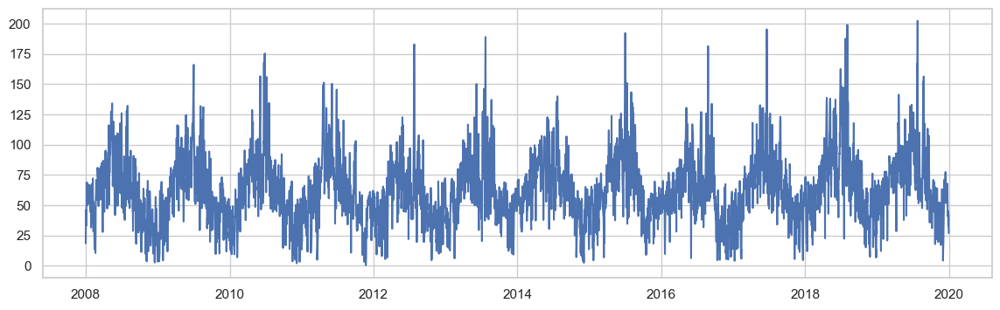

In [114]:
plt.figure(figsize=(14,4))
plt.plot(data_a.Concentration)

In [115]:
data_b = data_a.copy()
data_b = data_b.reset_index()

In [116]:
data_b

,Date,Concentration
0,2008-01-01,18.5000
1,2008-01-02,46.1250
2,2008-01-03,38.2500
3,2008-01-04,33.1250
4,2008-01-05,68.2500
...,...,...
4349,2019-12-27,45.2500
4350,2019-12-28,42.1250
4351,2019-12-29,32.8750
4352,2019-12-30,41.6875


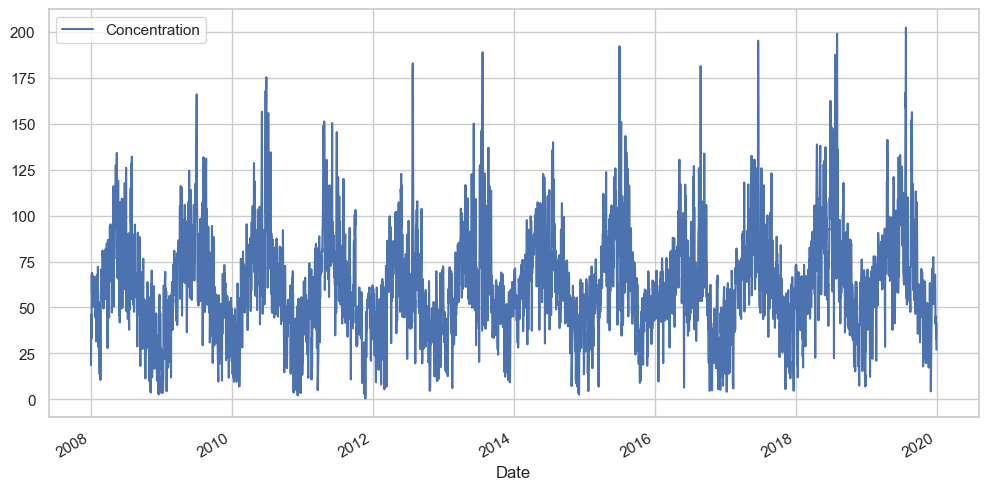

In [117]:
data_b['Date'] = pd.to_datetime(data_b['Date'])  # Convert date column to DateTime
ax = data_b.plot(x='Date', y='Concentration', figsize=(12, 6))

plt.show()

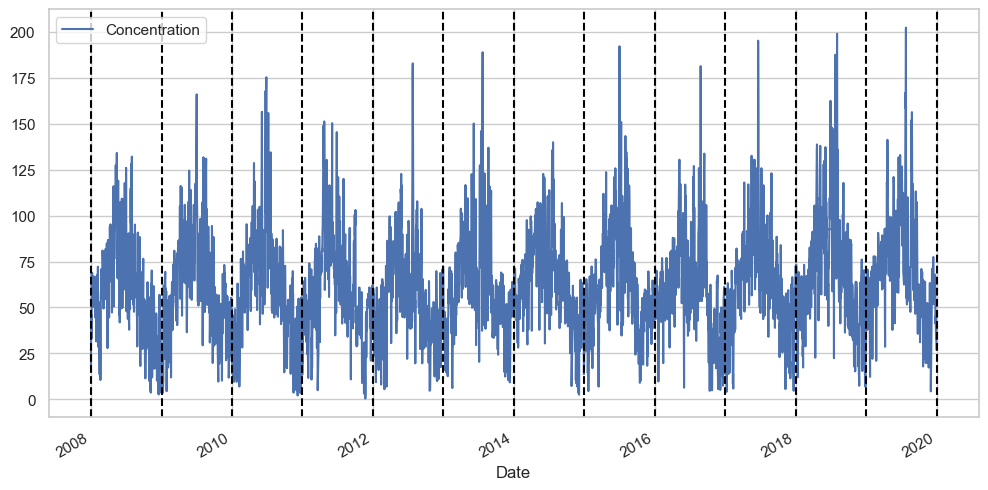

In [118]:
ax = data_b.plot(x='Date', y='Concentration', figsize=(12,6))
xcoords = ['2008-01-01', '2009-01-01', '2010-01-01', '2011-01-01', '2012-01-01', '2013-01-01', '2014-01-01', '2015-01-01', '2016-01-01','2017-01-01', '2018-01-01', '2019-01-01', '2020-01-01']
for xc in xcoords:
    plt.axvline(x=xc, color='black', linestyle='--')

##### We can slightly observe seasonality

In [119]:
data_a.dropna(subset=['Concentration'], inplace=True)

In [120]:
# Perform Augmented Dickey-Fuller test
result = adfuller(data_a)
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

# Interpret the results
if result[1] <= 0.05:
    print('The time series is likely stationary.')
else:
    print('The time series is likely non-stationary.')

ADF Statistic: -5.2086886970298085
p-value: 8.439989293394946e-06
Critical Values: {'1%': -3.4318618259487974, '5%': -2.8622080407621366, '10%': -2.5671256028256875}
The time series is likely stationary.


## Analysed stationarity

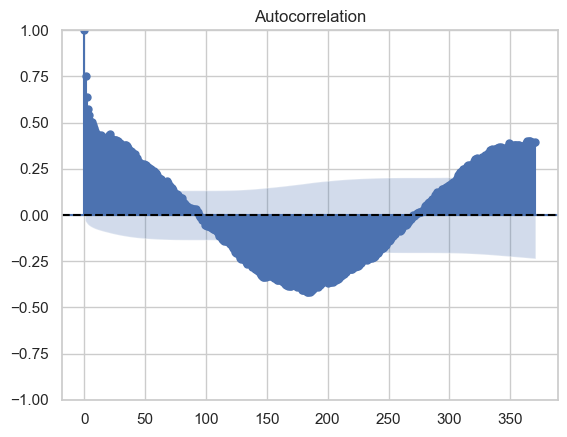

In [121]:
acf_plot = plot_acf(data_a.Concentration, lags=370)
plt.axhline(y=0, color='black', linestyle='--')

plt.show()

C:\Users\bro_1\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


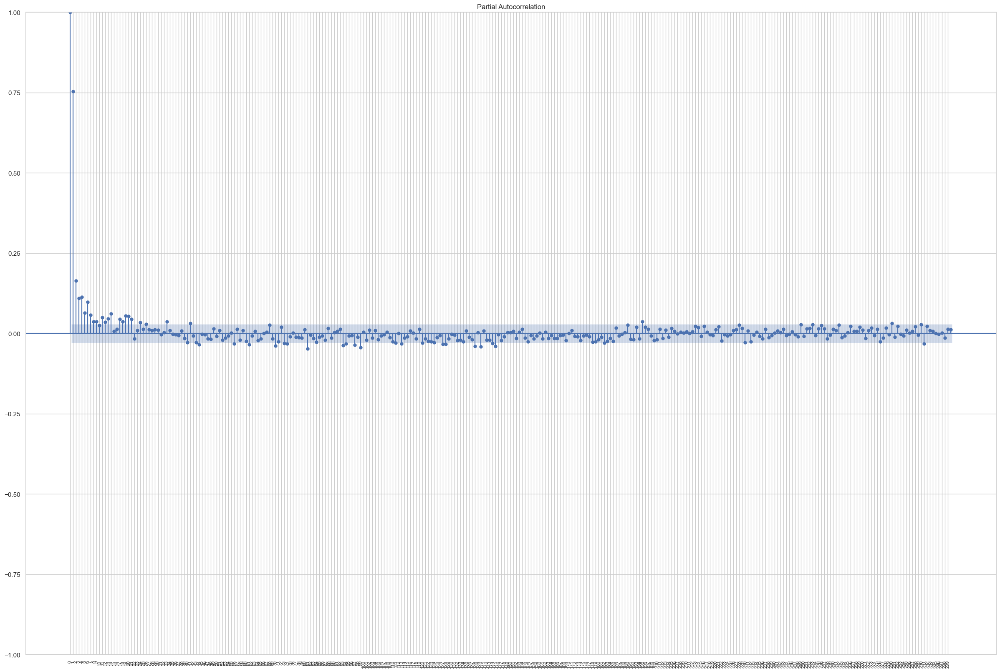

In [122]:
# Assuming you have a figure and axis
fig, ax = plt.subplots(figsize=(30, 20))

# Assuming your DataFrame is named 'data_a'
pacf_plot = plot_pacf(data_a['Concentration'], lags=300, ax=ax)

# Display the plot
plt.xticks(range(300), rotation='vertical', fontsize=8)
plt.show()

In [119]:
# Define the range of AR, MA, and seasonality values to check
ar_range = range(12)
ma_range = range(12)

# Initialize variables for tracking the best model
best_mse = float('inf')
best_order = None
best_results = None

# Iterate through AR and MA values
for p in ar_range:
    for q in ma_range:
        order = (p, 0, q)  # ARIMA order (p, d, q), here d=0 for ARMA
        model = sm.tsa.ARIMA(data_a['Concentration'], order=order)
        results = model.fit()

        # Calculate Mean Squared Error (MSE)
        fitted_values = results.fittedvalues
        mse = mean_squared_error(data_a['Concentration'], fitted_values)

        # Check if the current model has a lower MSE than the best so far
        if mse < best_mse:
            best_mse = mse
            best_order = order
            best_results = results

# Display the best model's information including AIC, BIC, MSE, and summary
print(f'Best Model Order: {best_order}')
print(f'Best Model AIC: {best_results.aic:.2f}')
print(f'Best Model BIC: {best_results.bic:.2f}')
print(f'Best Model MSE: {best_mse:.2f}')
print(best_results.summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Best Model Order: (10, 0, 11)
Best Model AIC: 37325.46
Best Model BIC: 37472.18
Best Model MSE: 306.39
                               SARIMAX Results                                
Dep. Variable:          Concentration   No. Observations:                 4354
Model:               ARIMA(10, 0, 11)   Log Likelihood              -18639.731
Date:                Mon, 04 Mar 2024   AIC                          37325.463
Time:                        12:49:22   BIC                          37472.176
Sample:                             0   HQIC                         37377.246
                               - 4354                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         63.0886      3.782     16.683      0.000      55.677      70.500
ar.L1          1.1219      0

In [123]:
# Fit ARMA (10, 0, 11)
order_arma = (10, 0, 11)  # ARIMA order (p, d, q), here d=0 for ARMA
model_arma = sm.tsa.ARIMA(data_a['Concentration'], order=order_arma)
results_arma = model_arma.fit()

# Extract the predicted (fitted) values
fitted_values = pd.DataFrame({
    'FittedValues': results_arma.fittedvalues
})

# Combine the original data_a DataFrame with the fitted values
data['FittedValues'] = fitted_values['FittedValues']

# Display the updated DataFrame
print(data)

C:\Users\bro_1\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\bro_1\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\bro_1\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\bro_1\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


            Year  Month  Day  Concentration  DayOfWeek  Weekend  FittedValues
Date                                                                         
2008-01-01  2008      1    1        18.5000          2        0     63.088603
2008-01-02  2008      1    2        46.1250          3        0     30.084161
2008-01-03  2008      1    3        38.2500          4        0     45.465490
2008-01-04  2008      1    4        33.1250          5        0     41.639625
2008-01-05  2008      1    5        68.2500          6        1     37.831722
...          ...    ...  ...            ...        ...      ...           ...
2019-12-27  2019     12   27        45.2500          5        0     48.942712
2019-12-28  2019     12   28        42.1250          6        1     50.905624
2019-12-29  2019     12   29        32.8750          0        1     48.324152
2019-12-30  2019     12   30        41.6875          1        0     41.298338
2019-12-31  2019     12   31        27.0000          2        0 

##### Model not valid, as Ljung test is 0.02. lower than 0.05.

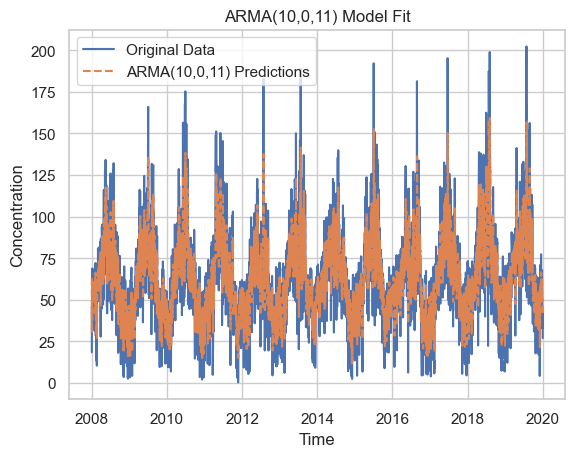

In [124]:
# Plot original data and predicted values
plt.plot(data_a, label='Original Data')
plt.plot(results_arma.fittedvalues, label='ARMA(10,0,11) Predictions', linestyle='--')
plt.title('ARMA(10,0,11) Model Fit')
plt.xlabel('Time')
plt.ylabel('Concentration')
plt.legend()
plt.show()

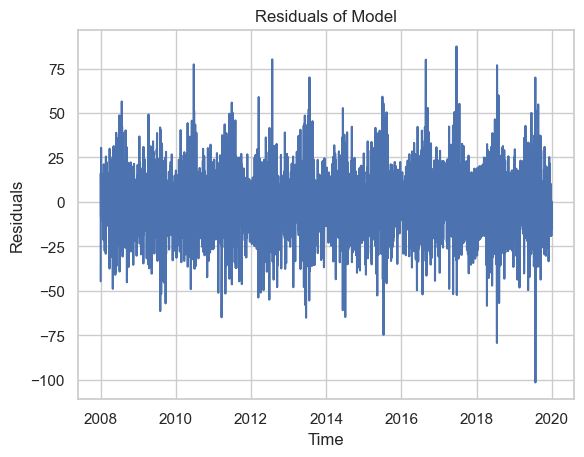

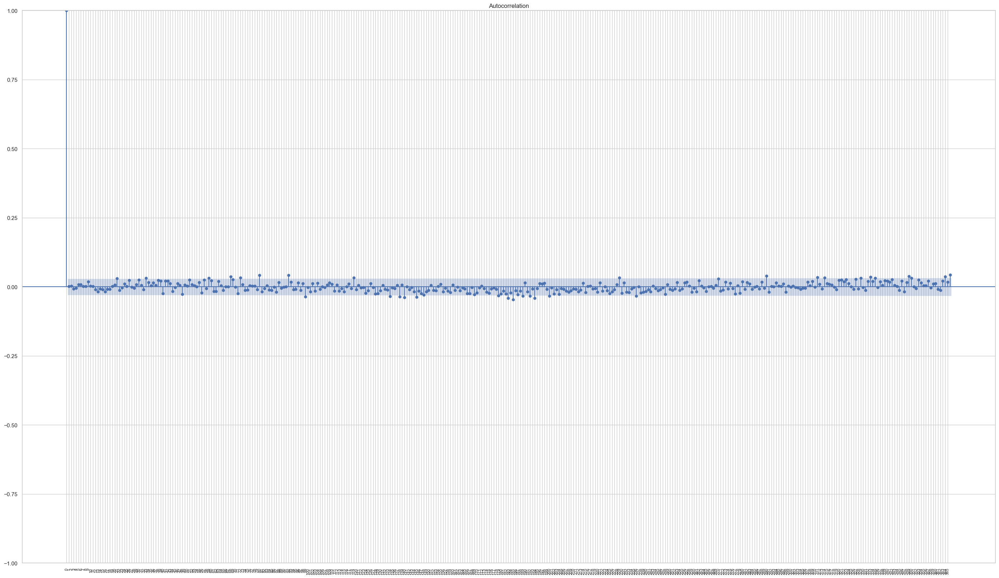

C:\Users\bro_1\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


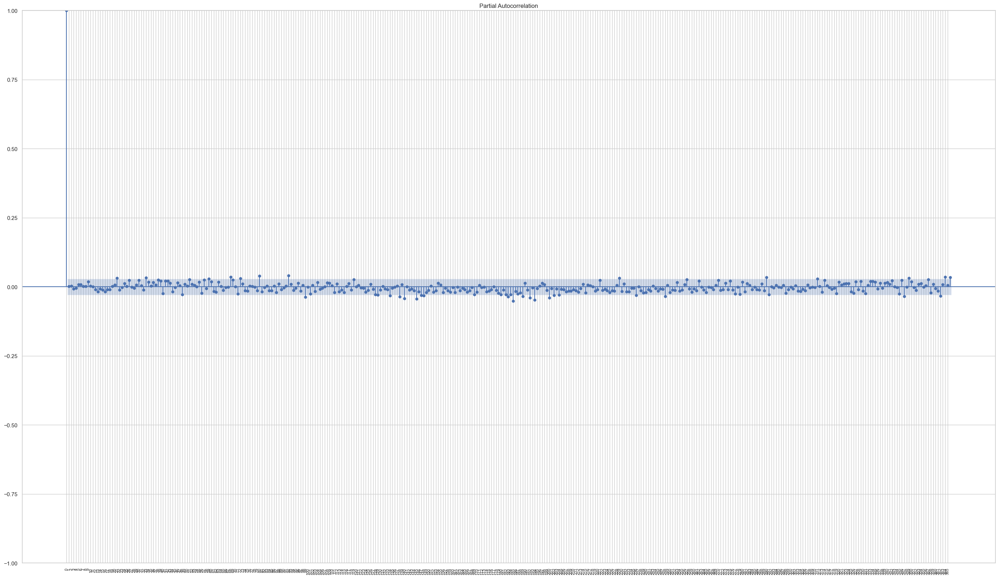

In [125]:
residuals = results_arma.resid

# Plot the residuals
plt.plot(residuals)
plt.title('Residuals of Model')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.show()

# Plot ACF and PACF of residuals
fig, ax = plt.subplots(figsize=(35, 20))

# Assuming your DataFrame is named 'data_a'
acf_plot = plot_acf(residuals, lags=366, ax=ax)

# Display the plot
plt.xticks(range(366), rotation='vertical', fontsize=8)
plt.show()


# Assuming you have a figure and axis
fig, ax = plt.subplots(figsize=(35, 20))

# Assuming your DataFrame is named 'data_a'
pacf_plot = plot_pacf(residuals, lags=366, ax=ax)

# Display the plot
plt.xticks(range(366), rotation='vertical', fontsize=8)
plt.show()

In [127]:
# Remove NaN values from 'Concentration' and 'FittedValues' columns
mask = ~np.isnan(data['Concentration']) & ~np.isnan(data['FittedValues'])
y_true = data['Concentration'][mask]
y_pred = data['FittedValues'][mask]

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_true, y_pred)
print(f'Mean Squared Error (MSE): {mse:.2f}')

Mean Squared Error (MSE): 310.07


The MSE is very high, its 310.07

## EDA on the ARIMA Values 

### FittedValues 

In [129]:
# Summary statistics for the "FittedValues" variable
summary_statistics_fitted_values = data['FittedValues'].describe()
print(summary_statistics_fitted_values)

count    4354.000000
mean       63.092791
std        21.577749
min        11.740772
25%        48.416255
50%        61.301586
75%        76.506098
max       159.401409
Name: FittedValues, dtype: float64


In [130]:
# Summary statistics for the "FittedValues" variable
summary_statistics_concentration = data['Concentration'].describe()
print(summary_statistics_concentration)

count    4274.000000
mean       63.185994
std        27.941785
min         0.375000
25%        45.312500
50%        60.937500
75%        78.437500
max       202.312500
Name: Concentration, dtype: float64


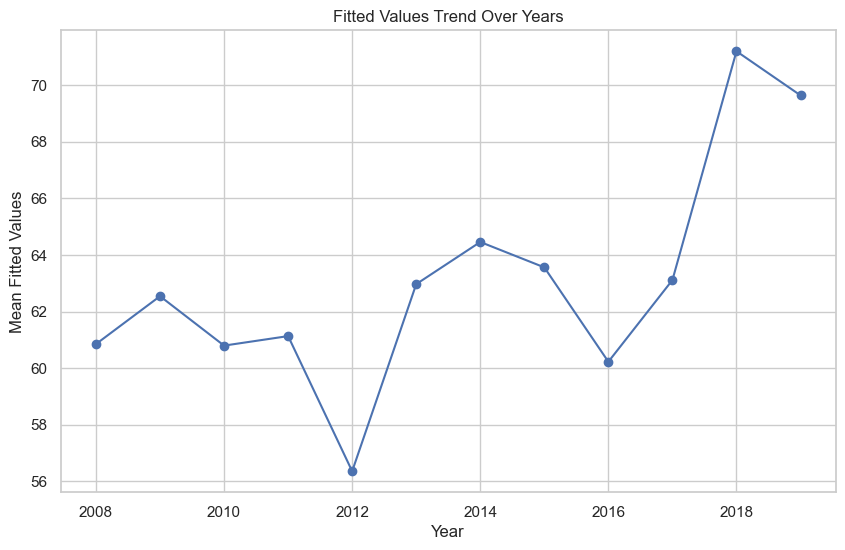

In [131]:
## Trend analysis

# Group the data by Year and calculate the mean fitted values for each year
trend_data_fitted_values = data.groupby('Year')['FittedValues'].mean()

# Plotting the trend for fitted values over the years
plt.figure(figsize=(10, 6))
plt.plot(trend_data_fitted_values.index, trend_data_fitted_values.values, marker='o', linestyle='-')
plt.title('Fitted Values Trend Over Years')
plt.xlabel('Year')
plt.ylabel('Mean Fitted Values')
plt.grid(True)
plt.show()

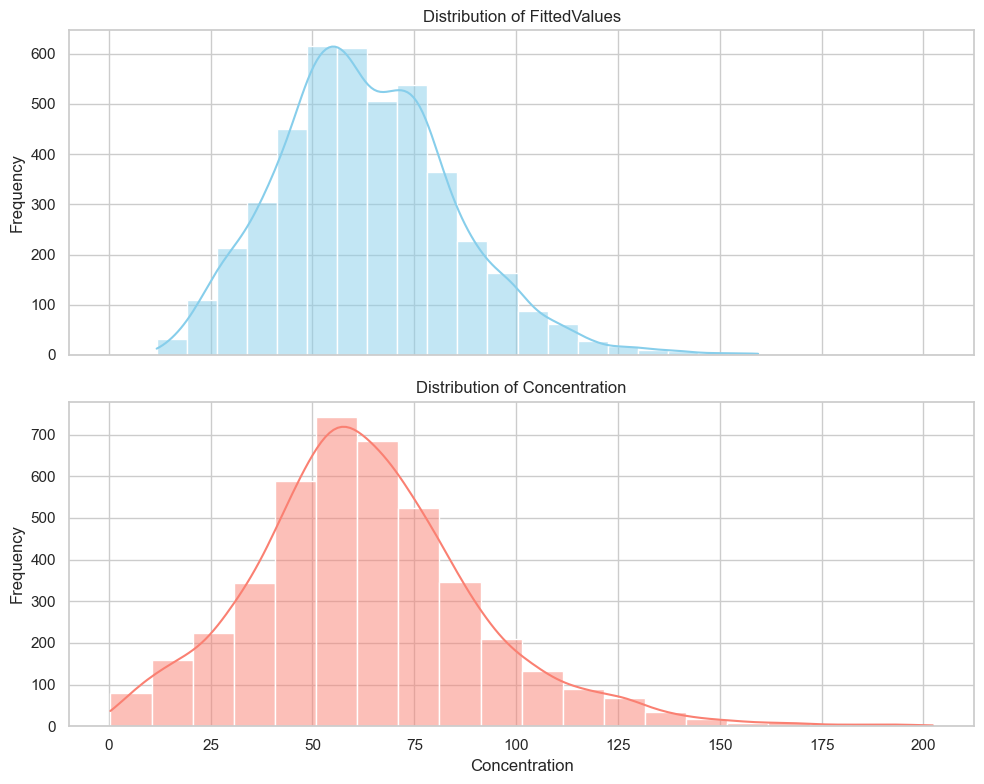

In [134]:
### Distribution
## Two distributions compared to eachother

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create subplots for 'FittedValues' and 'Concentration'
fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot histograms for 'FittedValues'
sns.histplot(data['FittedValues'], bins=20, kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Distribution of FittedValues')
axes[0].set_xlabel('FittedValues')
axes[0].set_ylabel('Frequency')

# Plot histograms for 'Concentration'
sns.histplot(data['Concentration'], bins=20, kde=True, ax=axes[1], color='salmon')
axes[1].set_title('Distribution of Concentration')
axes[1].set_xlabel('Concentration')
axes[1].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

In [135]:
data.head()

,Year,Month,Day,Concentration,DayOfWeek,Weekend,FittedValues
Date,,,,,,,
2008-01-01,2008,1,1,18.500,2,0,63.088603
2008-01-02,2008,1,2,46.125,3,0,30.084161
2008-01-03,2008,1,3,38.250,4,0,45.465490
2008-01-04,2008,1,4,33.125,5,0,41.639625
2008-01-05,2008,1,5,68.250,6,1,37.831722


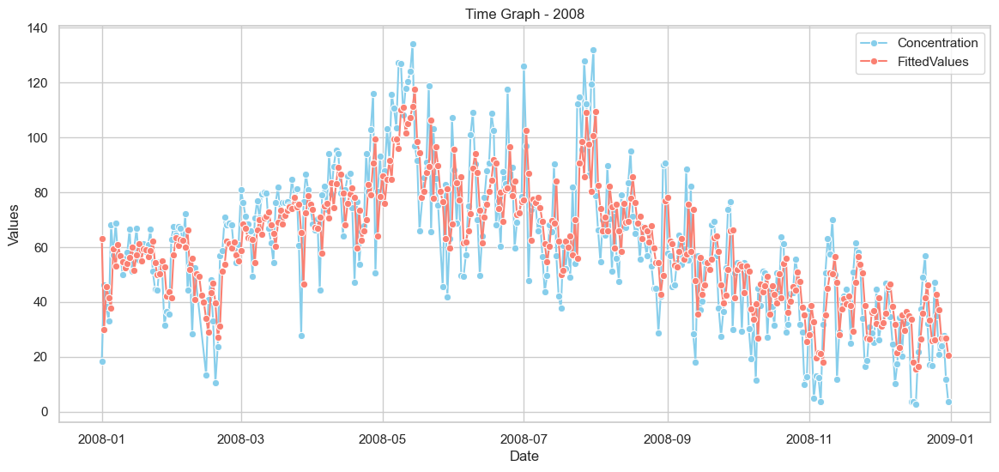

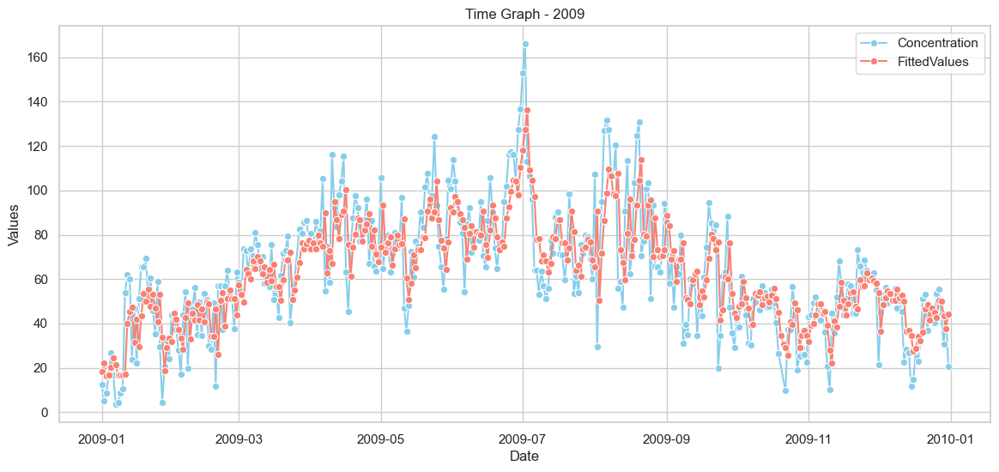

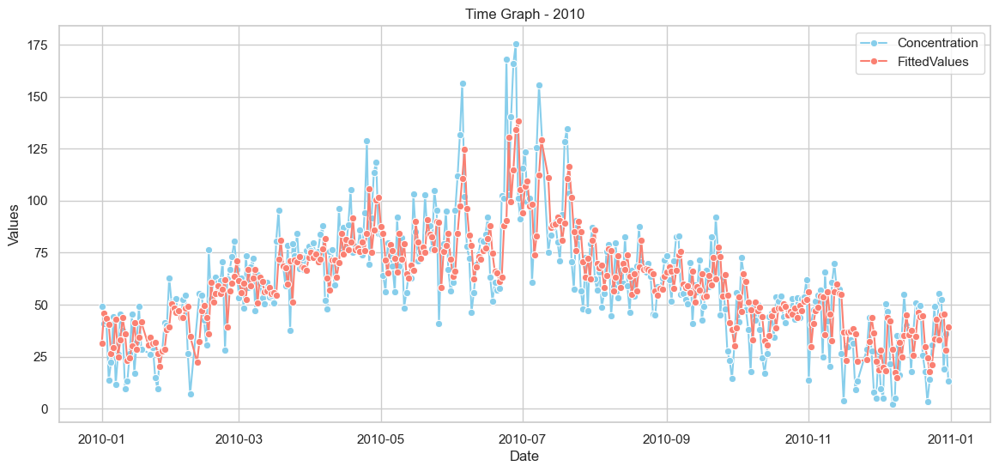

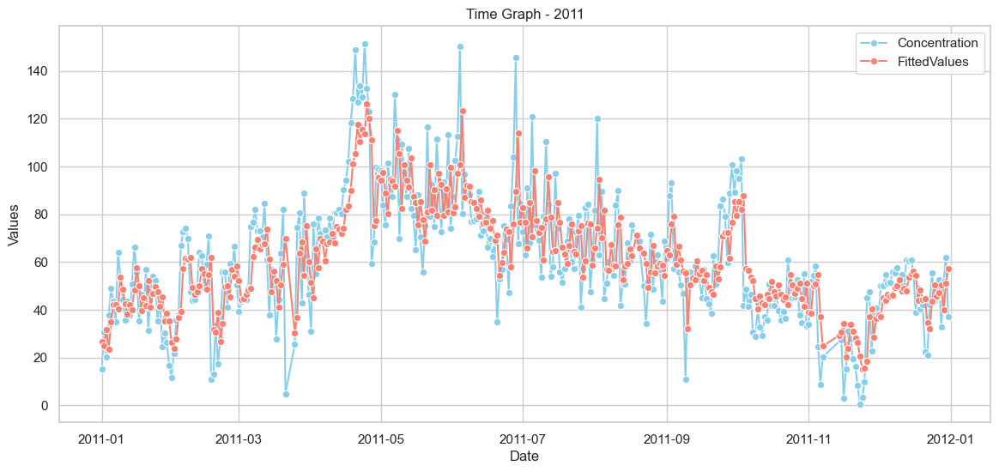

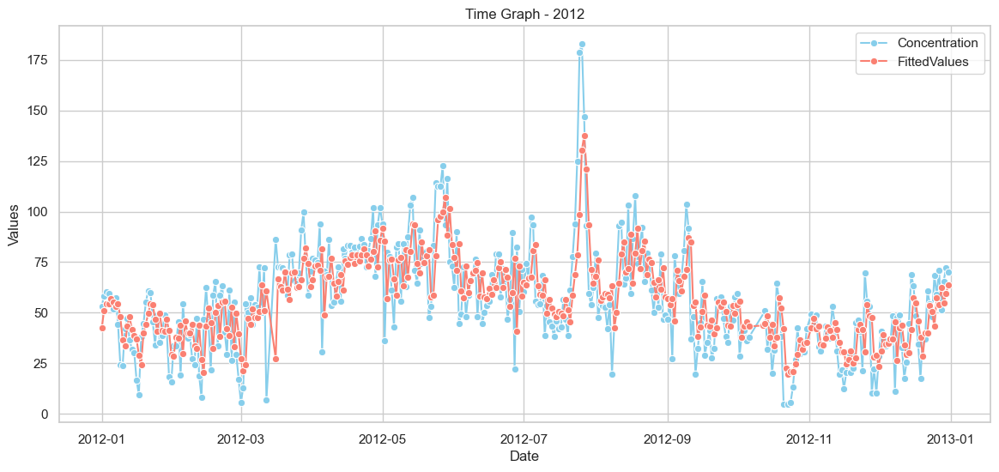

...

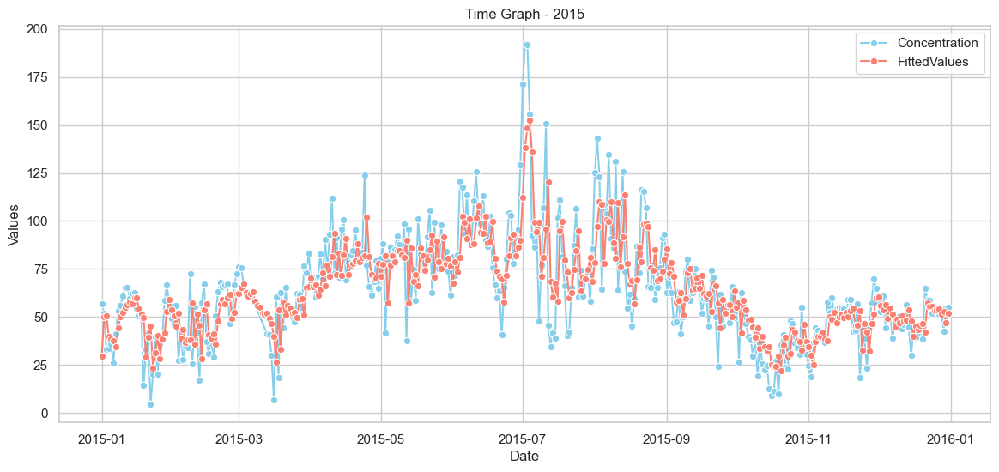

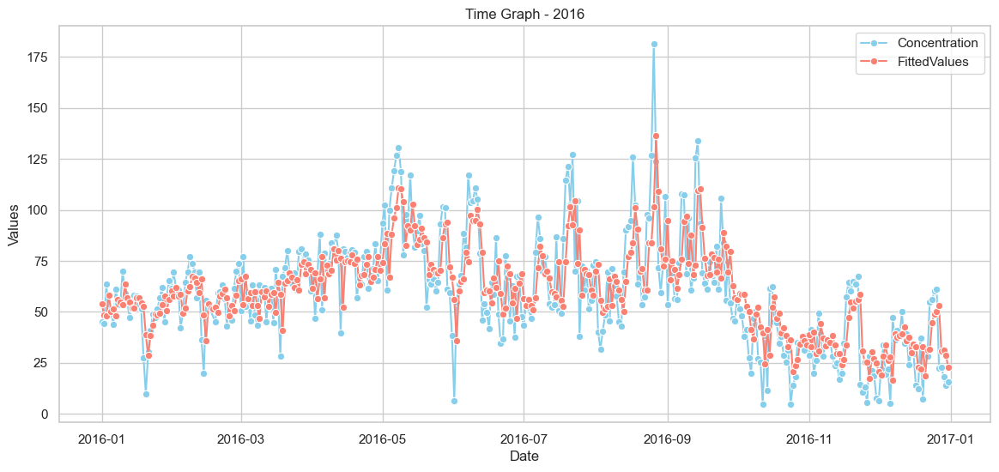

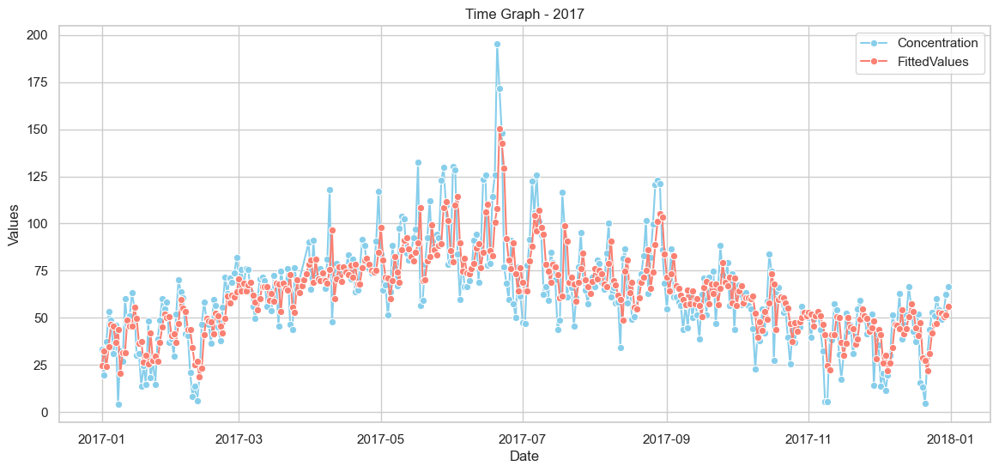

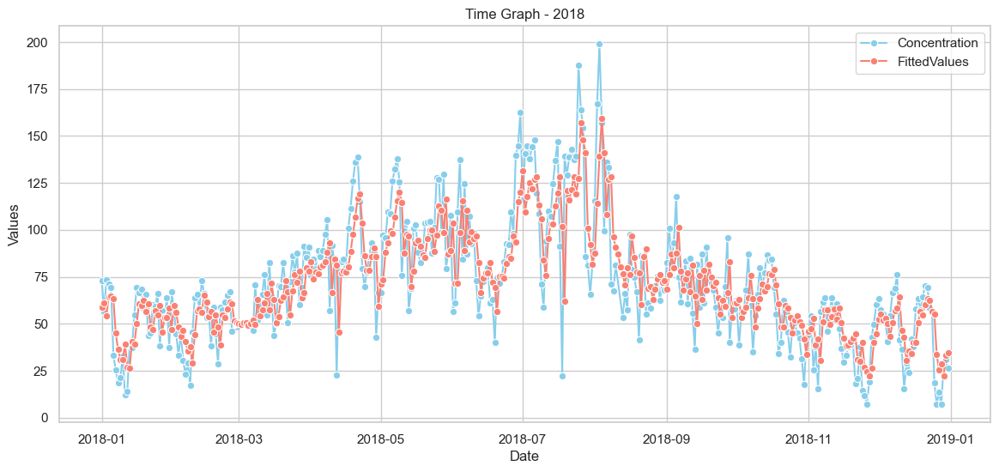

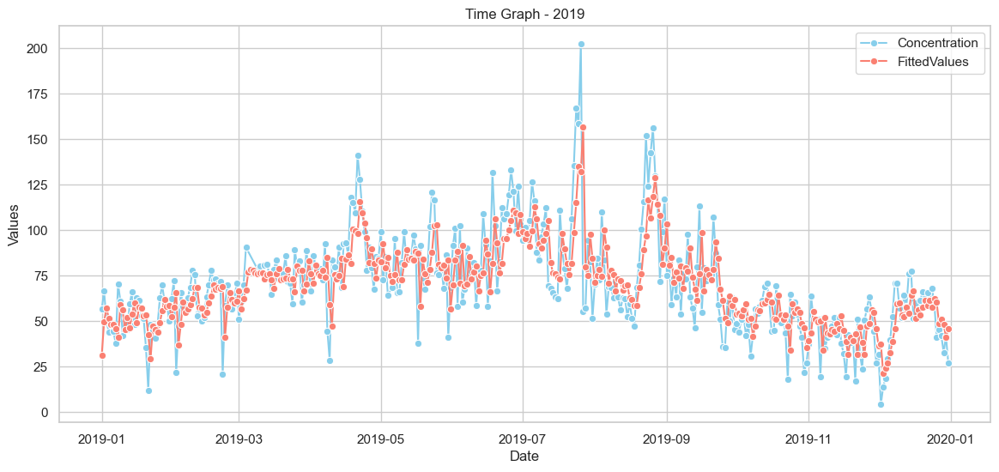

In [136]:
### Comparison of FittedValues and Concentration for each year

# Setting the style for better visualization
sns.set(style="whitegrid")

# Group the data by Year and Date, and calculate the mean for 'Concentration' and 'FittedValues'
yearly_data = data.groupby(['Year', 'Date'])[['Concentration', 'FittedValues']].mean().reset_index()

# Create separate time graphs for each year
for year in range(2008, 2020):
    year_data = yearly_data[yearly_data['Year'] == year]
    
    plt.figure(figsize=(14, 6))
    sns.lineplot(x='Date', y='Concentration', data=year_data, label='Concentration', marker='o', color='skyblue')
    sns.lineplot(x='Date', y='FittedValues', data=year_data, label='FittedValues', marker='o', color='salmon')
    
    plt.title(f'Time Graph - {year}')
    plt.xlabel('Date')
    plt.ylabel('Values')
    plt.legend()
    
    plt.show()

In [138]:
### Outlier comparison

# Calculate Z-scores for Concentration and FittedValues within each year
data['Z_score_concentration'] = data.groupby('Year')['Concentration'].transform(lambda x: (x - x.mean()) / x.std())
data['Z_score_fittedvalues'] = data.groupby('Year')['FittedValues'].transform(lambda x: (x - x.mean()) / x.std())

# Define a threshold for considering points as outliers (e.g., Z-score > 3 or < -3)
outlier_threshold = 3

# Identify and count outliers for each year for Concentration and FittedValues
outliers_by_year = data.groupby('Year')[['Z_score_concentration', 'Z_score_fittedvalues']] \
    .apply(lambda x: (abs(x) > outlier_threshold).sum()).reset_index()

outliers_by_year.columns = ['Year', 'Number_of_Outliers_Concentration', 'Number_of_Outliers_FittedValues']

# Calculate total outliers across all years
total_outliers = outliers_by_year[['Number_of_Outliers_Concentration', 'Number_of_Outliers_FittedValues']].sum()
total_outliers['Year'] = 'Total'
outliers_by_year = outliers_by_year.append(total_outliers, ignore_index=True)

# Print the result
print(outliers_by_year)

     Year  Number_of_Outliers_Concentration  Number_of_Outliers_FittedValues
0    2008                                 0                                0
1    2009                                 2                                1
2    2010                                 5                                4
3    2011                                 4                                1
4    2012                                 3                                3
5    2013                                 3                                2
6    2014                                 1                                0
7    2015                                 5                                4
8    2016                                 1                                1
9    2017                                 3                                3
10   2018                                 2                                2
11   2019                                 5                                3

C:\Users\bro_1\AppData\Local\Temp\ipykernel_35364\1399220381.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers_by_year = outliers_by_year.append(total_outliers, ignore_index=True)


# Now we calculate the lagged values of Concentration (making a new variable with the value from day before, a week before, a month before, and a year before)

In [139]:
# Assuming 'Date' is your index
data['day_lag1'] = data['Concentration'].shift(1)
data['day_lag7'] = data['Concentration'].shift(7)

# If 'Date' is not the index, you can use the following instead
# data['day_lag1'] = data['Concentration'].shift(1).reset_index(drop=True)

print(data.head())

            Year  Month  Day  Concentration  DayOfWeek  Weekend  FittedValues  \
Date                                                                            
2008-01-01  2008      1    1         18.500          2        0     63.088603   
2008-01-02  2008      1    2         46.125          3        0     30.084161   
2008-01-03  2008      1    3         38.250          4        0     45.465490   
2008-01-04  2008      1    4         33.125          5        0     41.639625   
2008-01-05  2008      1    5         68.250          6        1     37.831722   

            Z_score_concentration  Z_score_fittedvalues  day_lag1  day_lag7  
Date                                                                         
2008-01-01              -1.582507              0.109474       NaN       NaN  
2008-01-02              -0.543480             -1.505743    18.500       NaN  
2008-01-03              -0.839673             -0.752990    46.125       NaN  
2008-01-04              -1.032434         

In [140]:
# Assuming data is your DataFrame
data['day_lag30'] = data.apply(
    lambda row: data.loc[
        (data['Year'] == row['Year']) &
        (data['Month'] == row['Month'] - 1) &
        (data['Day'] == row['Day']),
        'Concentration'].iloc[0] if row['Month'] > 1 and not data.loc[
        (data['Year'] == row['Year']) &
        (data['Month'] == row['Month'] - 1) &
        (data['Day'] == row['Day']),
        'Concentration'].empty else np.nan, axis=1
)

data['day_lag365'] = data.apply(
    lambda row: data.loc[
        (data['Year'] == row['Year'] - 1) &
        (data['Month'] == row['Month']) &
        (data['Day'] == row['Day']),
        'Concentration'].iloc[0] if row['Year'] > data['Year'].min() and not data.loc[
        (data['Year'] == row['Year'] - 1) &
        (data['Month'] == row['Month']) &
        (data['Day'] == row['Day']),
        'Concentration'].empty else np.nan, axis=1
)

In [144]:
# Columns to calculate errors for
lag_columns = ['day_lag1', 'day_lag7', 'day_lag30', 'day_lag365']

# Create a new DataFrame for the dropped missing values
data_dropped = data.dropna()

# Loop through lag columns and calculate MSE and MAE for dropped DataFrame
for lag_column in lag_columns:
    mse_dropped = mean_squared_error(data_dropped['Concentration'], data_dropped[lag_column], squared=True)
    mae_dropped = mean_absolute_error(data_dropped['Concentration'], data_dropped[lag_column])
    
    print(f'MSE for {lag_column} with dropped values: {mse_dropped}')
    print(f'MAE for {lag_column} with dropped values: {mae_dropped}')

MSE for day_lag1 with dropped values: 419.17309283088235
MAE for day_lag1 with dropped values: 15.183688080495356
MSE for day_lag7 with dropped values: 864.3185927825077
MAE for day_lag7 with dropped values: 22.0921826625387
MSE for day_lag30 with dropped values: 1011.7208458301084
MAE for day_lag30 with dropped values: 24.373239164086687
MSE for day_lag365 with dropped values: 927.5606811145511
MAE for day_lag365 with dropped values: 22.959868421052633


# Extra PreProc

## Introduction of Holiday variable

In [145]:
# List of holiday dates with months and days
holiday_dates = {
    (1, 1),   # New Year's Day
    (1, 6),   # Epiphany
    (2, 14),  # Valentine's Day
    (3, 20),  # March Equinox
    (3, 29),  # Good Friday
    (3, 31),  # Easter Sunday
    (4, 1),   # Easter Monday
    (5, 1),   # Labor Day / May Day
    (5, 8),   # Iris Day (Brussels Regional holiday)
    (5, 9),   # Ascension Day
    (5, 10),  # Day after Ascension Day
    (5, 12),  # Mothers' Day
    (5, 19),  # Whit Sunday
    (5, 20),  # Whit Monday
    (6, 9),   # Fathers' Day
    (6, 20),  # June Solstice
    (7, 11),  # Day of the Flemish Community (Regional holiday in some provinces)
    (7, 21),  # Belgian National Day
    (8, 15),  # Assumption of Mary
    (9, 15),  # Day of the Walloon Region (Regional holiday in Namur)
    (9, 22),  # September Equinox
    (9, 27),  # Day of the French Community (Regional holiday in some provinces)
    (10, 27), # Daylight Saving Time ends
    (10, 31), # Halloween
    (11, 1),  # All Saints' Day
    (11, 11), # Armistice Day
    (11, 15), # Day of the German-speaking Community (Regional holiday in Liège)
    (12, 6),  # St. Nicholas Day
    (12, 21), # December Solstice
    (12, 24), # Christmas Eve
    (12, 25), # Christmas Day
    (12, 26), # Boxing Day
    (12, 31)  # New Year's Eve
}

# Create a new column 'IsHoliday' and set it to 1 for holidays, 0 otherwise
data['IsHoliday'] = data.apply(lambda row: 1 if (row['Month'], row['Day']) in holiday_dates else 0, axis=1)

# Display the updated DataFrame
print(data)

            Year  Month  Day  Concentration  DayOfWeek  Weekend  FittedValues  \
Date                                                                            
2008-01-01  2008      1    1        18.5000          2        0     63.088603   
2008-01-02  2008      1    2        46.1250          3        0     30.084161   
2008-01-03  2008      1    3        38.2500          4        0     45.465490   
2008-01-04  2008      1    4        33.1250          5        0     41.639625   
2008-01-05  2008      1    5        68.2500          6        1     37.831722   
...          ...    ...  ...            ...        ...      ...           ...   
2019-12-27  2019     12   27        45.2500          5        0     48.942712   
2019-12-28  2019     12   28        42.1250          6        1     50.905624   
2019-12-29  2019     12   29        32.8750          0        1     48.324152   
2019-12-30  2019     12   30        41.6875          1        0     41.298338   
2019-12-31  2019     12   31

## EDA on Holiday 

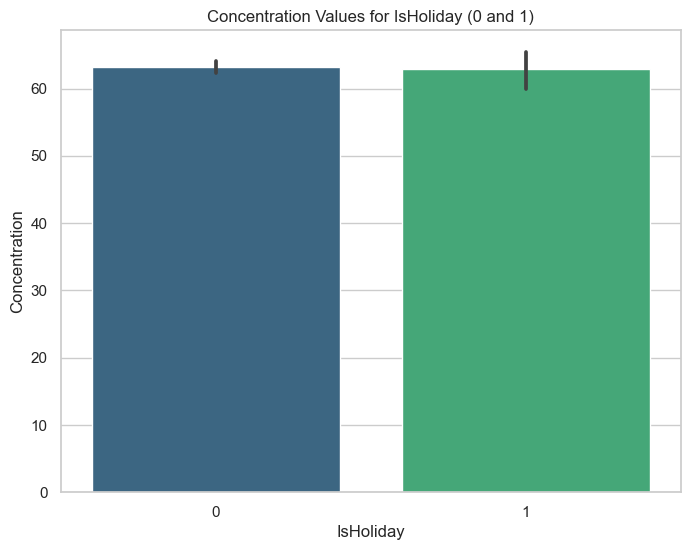

In [147]:
### Bar plot comparison

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create a bar plot for concentration values based on the 'IsHoliday' variable
plt.figure(figsize=(8, 6))
sns.barplot(x='IsHoliday', y='Concentration', data=data, palette='viridis')
plt.title('Concentration Values for IsHoliday (0 and 1)')
plt.xlabel('IsHoliday')
plt.ylabel('Concentration')
plt.show()

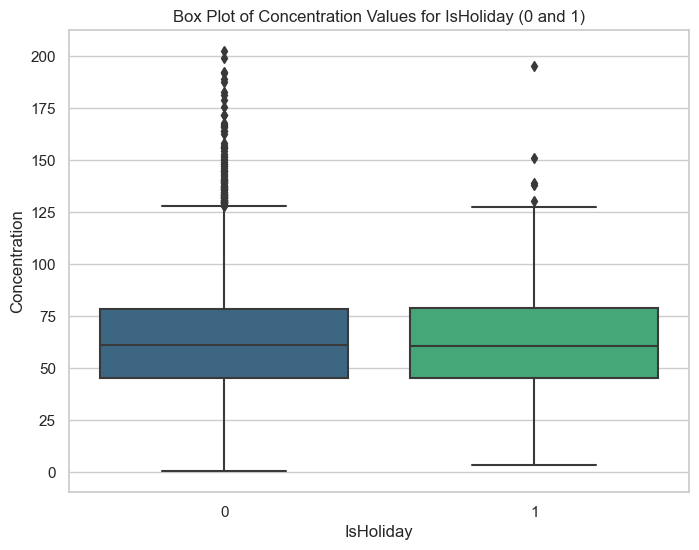

In [148]:
### Box Plot

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create a box plot for concentration values based on the 'IsHoliday' variable
plt.figure(figsize=(8, 6))
sns.boxplot(x='IsHoliday', y='Concentration', data=data, palette='viridis')
plt.title('Box Plot of Concentration Values for IsHoliday (0 and 1)')
plt.xlabel('IsHoliday')
plt.ylabel('Concentration')
plt.show()

In [151]:
### Number of outliers in each case

# Calculate Z-scores for Concentration within each category of the 'IsHoliday' variable
data['Z_score_concentration'] = data.groupby('IsHoliday')['Concentration'].transform(lambda x: (x - x.mean()) / x.std())

# Define a threshold for considering points as outliers (e.g., Z-score > 3 or < -3)
outlier_threshold = 3

# Identify and count outliers for each category in the 'IsHoliday' variable
outliers_by_isholiday = data.groupby('IsHoliday')['Z_score_concentration'].apply(lambda x: (abs(x) > outlier_threshold).sum()).reset_index()
outliers_by_isholiday.columns = ['IsHoliday', 'Number_of_Outliers']

# Calculate the percentage of outliers for each category
total_rows_by_isholiday = data['IsHoliday'].value_counts().reset_index()
total_rows_by_isholiday.columns = ['IsHoliday', 'Total_Rows']

outliers_percentage_by_isholiday = pd.merge(outliers_by_isholiday, total_rows_by_isholiday, on='IsHoliday')
outliers_percentage_by_isholiday['Percentage_of_Outliers'] = (outliers_percentage_by_isholiday['Number_of_Outliers'] / outliers_percentage_by_isholiday['Total_Rows']) * 100

# Print the result
print(outliers_percentage_by_isholiday)

   IsHoliday  Number_of_Outliers  Total_Rows  Percentage_of_Outliers
0          0                  35        3961                0.883615
1          1                   2         393                0.508906


In [152]:
### Summary statistics for both

# Calculate summary statistics for Concentration when IsHoliday is 0
summary_stats_isholiday_0 = data[data['IsHoliday'] == 0]['Concentration'].describe()

# Calculate summary statistics for Concentration when IsHoliday is 1
summary_stats_isholiday_1 = data[data['IsHoliday'] == 1]['Concentration'].describe()

# Combine the results into a single DataFrame
summary_stats_combined = pd.DataFrame({
    'IsHoliday': [0, 1],
    'Median': [summary_stats_isholiday_0['50%'], summary_stats_isholiday_1['50%']],
    'Mean': [summary_stats_isholiday_0['mean'], summary_stats_isholiday_1['mean']],
    'Min': [summary_stats_isholiday_0['min'], summary_stats_isholiday_1['min']],
    'Max': [summary_stats_isholiday_0['max'], summary_stats_isholiday_1['max']]
})

# Print the result
print(summary_stats_combined)

   IsHoliday   Median       Mean    Min       Max
0          0  60.9375  63.213966  0.375  202.3125
1          1  60.6250  62.905039  3.500  195.2500


## Introduction of Season Variable

In [154]:
# Define the season based on the month with numerical values
data['Season'] = data['Month'].apply(lambda x:
                                     1 if (x == 12 or x <= 2) else
                                     2 if (x >= 3 and x <= 5) else
                                     3 if (x >= 6 and x <= 8) else
                                     4 if (x >= 9 and x <= 11) else None)

# Display the updated DataFrame
print(data)
data['Season'].unique()

            Year  Month  Day  Concentration  DayOfWeek  Weekend  FittedValues  \
Date                                                                            
2008-01-01  2008      1    1        18.5000          2        0     63.088603   
2008-01-02  2008      1    2        46.1250          3        0     30.084161   
2008-01-03  2008      1    3        38.2500          4        0     45.465490   
2008-01-04  2008      1    4        33.1250          5        0     41.639625   
2008-01-05  2008      1    5        68.2500          6        1     37.831722   
...          ...    ...  ...            ...        ...      ...           ...   
2019-12-27  2019     12   27        45.2500          5        0     48.942712   
2019-12-28  2019     12   28        42.1250          6        1     50.905624   
2019-12-29  2019     12   29        32.8750          0        1     48.324152   
2019-12-30  2019     12   30        41.6875          1        0     41.298338   
2019-12-31  2019     12   31

array([1, 2, 3, 4], dtype=int64)

## EDA on Season 

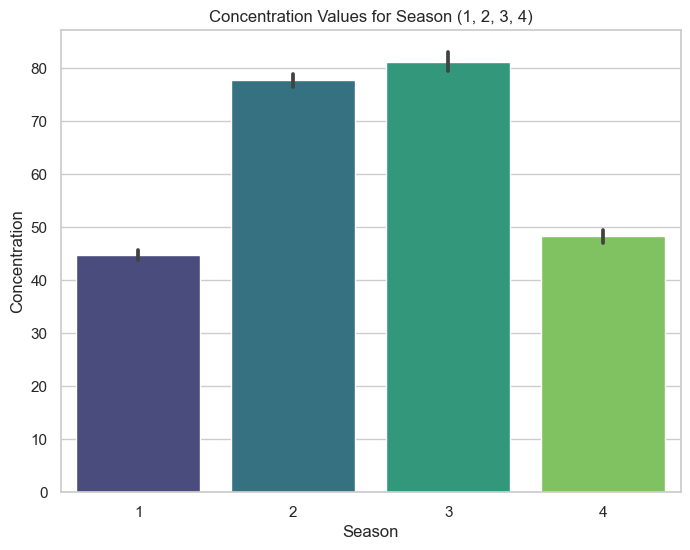

In [155]:
### Bar plot of season

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create a bar plot for concentration values based on the 'Season' variable
plt.figure(figsize=(8, 6))
sns.barplot(x='Season', y='Concentration', data=data, palette='viridis')
plt.title('Concentration Values for Season (1, 2, 3, 4)')
plt.xlabel('Season')
plt.ylabel('Concentration')
plt.show()

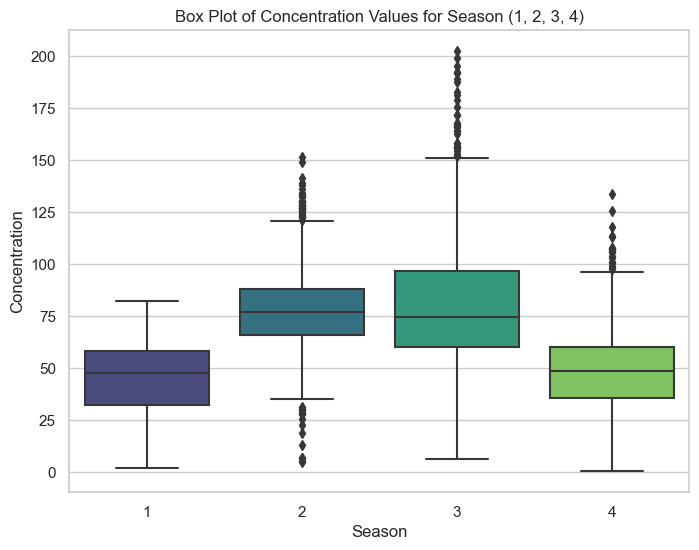

In [156]:
### Box plot

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create a box plot for concentration values based on the 'Season' variable
plt.figure(figsize=(8, 6))
sns.boxplot(x='Season', y='Concentration', data=data, palette='viridis')
plt.title('Box Plot of Concentration Values for Season (1, 2, 3, 4)')
plt.xlabel('Season')
plt.ylabel('Concentration')
plt.show()

In [157]:
### Number of outliers

# Calculate Z-scores for Concentration within each category of the 'Season' variable
data['Z_score_concentration'] = data.groupby('Season')['Concentration'].transform(lambda x: (x - x.mean()) / x.std())

# Define a threshold for considering points as outliers (e.g., Z-score > 3 or < -3)
outlier_threshold = 3

# Identify and count outliers for each category in the 'Season' variable
outliers_by_season = data.groupby('Season')['Z_score_concentration'].apply(lambda x: (abs(x) > outlier_threshold).sum()).reset_index()
outliers_by_season.columns = ['Season', 'Number_of_Outliers']

# Calculate the percentage of outliers for each category
total_rows_by_season = data['Season'].value_counts().reset_index()
total_rows_by_season.columns = ['Season', 'Total_Rows']

outliers_percentage_by_season = pd.merge(outliers_by_season, total_rows_by_season, on='Season')
outliers_percentage_by_season['Percentage_of_Outliers'] = (outliers_percentage_by_season['Number_of_Outliers'] / outliers_percentage_by_season['Total_Rows']) * 100

# Print the result
print(outliers_percentage_by_season)

   Season  Number_of_Outliers  Total_Rows  Percentage_of_Outliers
0       1                   0        1079                0.000000
1       2                   9        1098                0.819672
2       3                  13        1100                1.181818
3       4                   5        1077                0.464253


In [158]:
### Summary statistics

# Calculate summary statistics for Concentration when Season is 1
summary_stats_season_1 = data[data['Season'] == 1]['Concentration'].describe()

# Calculate summary statistics for Concentration when Season is 2
summary_stats_season_2 = data[data['Season'] == 2]['Concentration'].describe()

# Calculate summary statistics for Concentration when Season is 3
summary_stats_season_3 = data[data['Season'] == 3]['Concentration'].describe()

# Calculate summary statistics for Concentration when Season is 4
summary_stats_season_4 = data[data['Season'] == 4]['Concentration'].describe()

# Combine the results into a single DataFrame
summary_stats_combined_season = pd.DataFrame({
    'Season': [1, 2, 3, 4],
    'Median': [summary_stats_season_1['50%'], summary_stats_season_2['50%'], summary_stats_season_3['50%'], summary_stats_season_4['50%']],
    'Mean': [summary_stats_season_1['mean'], summary_stats_season_2['mean'], summary_stats_season_3['mean'], summary_stats_season_4['mean']],
    'Min': [summary_stats_season_1['min'], summary_stats_season_2['min'], summary_stats_season_3['min'], summary_stats_season_4['min']],
    'Max': [summary_stats_season_1['max'], summary_stats_season_2['max'], summary_stats_season_3['max'], summary_stats_season_4['max']]
})

# Print the result
print(summary_stats_combined_season)

   Season  Median       Mean     Min       Max
0       1  47.625  44.781663  2.0625   82.0625
1       2  77.000  77.807350  4.9375  151.2500
2       3  74.625  81.316305  6.3125  202.3125
3       4  48.625  48.345810  0.3750  133.7500


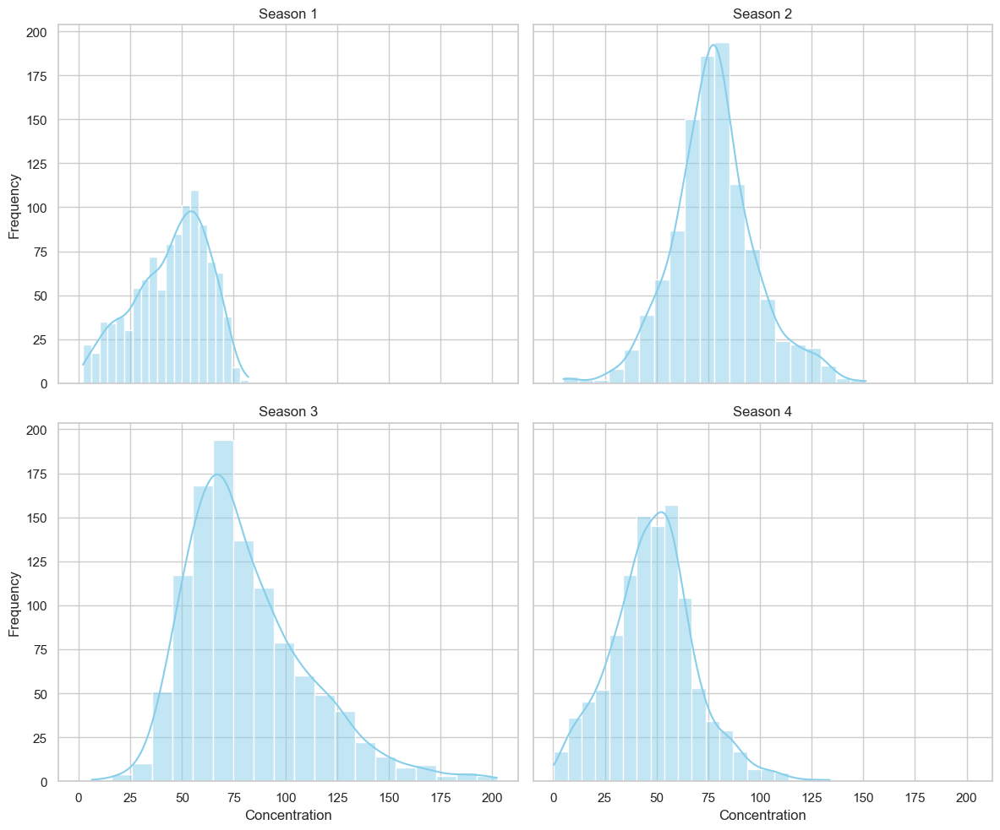

In [159]:
### Distributions

# Setting the style for better visualization
sns.set(style="whitegrid")

# Create subplots for each season
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True, sharey=True)

# Flatten the axes for easier indexing
axes = axes.flatten()

# Plot histograms for concentration values for each season
for i, (season, group) in enumerate(data.groupby('Season')):
    sns.histplot(group['Concentration'], bins=20, kde=True, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Season {season}')
    axes[i].set_xlabel('Concentration')
    axes[i].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

## Removal of missing values?

In [129]:
# Check for missing values in the 'Concentration' column
rows_with_missing_values = data[data['Concentration'].isna()]

# Display rows with missing values
print("Rows with missing values in 'Concentration' column:")
print(rows_with_missing_values)

Rows with missing values in 'Concentration' column:
            Year  Month  Day  Concentration  DayOfWeek  Weekend  FittedValues  \
Date                                                                            
2008-02-11  2008      2   11            NaN          1        0     50.398943   
2008-02-12  2008      2   12            NaN          2        0     49.418922   
2008-02-13  2008      2   13            NaN          3        0     42.494426   
2008-02-14  2008      2   14            NaN          4        0     39.997328   
2008-05-18  2008      5   18            NaN          0        1     78.208064   
...          ...    ...  ...            ...        ...      ...           ...   
2019-03-05  2019      3    5            NaN          2        0     76.815088   
2019-03-06  2019      3    6            NaN          3        0     78.680839   
2019-03-07  2019      3    7            NaN          4        0     78.092582   
2019-03-08  2019      3    8            NaN          5   

In [130]:
# Remove rows with null values in the 'Concentration' column in-place
data.dropna(subset=['Concentration'], inplace=True)

# Display the modified data
print(data.info())
data.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4274 entries, 2008-01-01 to 2019-12-31
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Year           4274 non-null   int64  
 1   Month          4274 non-null   int64  
 2   Day            4274 non-null   int64  
 3   Concentration  4274 non-null   float64
 4   DayOfWeek      4274 non-null   int64  
 5   Weekend        4274 non-null   int64  
 6   FittedValues   4274 non-null   float64
 7   day_lag1       4237 non-null   float64
 8   day_lag7       4188 non-null   float64
 9   day_lag30      3718 non-null   float64
 10  day_lag365     3813 non-null   float64
 11  IsHoliday      4274 non-null   int64  
 12  Season         4274 non-null   int64  
dtypes: float64(6), int64(7)
memory usage: 467.5 KB
None


,Year,Month,Day,Concentration,DayOfWeek,Weekend,FittedValues,day_lag1,day_lag7,day_lag30,day_lag365,IsHoliday,Season
Date,,,,,,,,,,,,,
2008-01-01,2008,1,1,18.500,2,0,63.088600,NaN,NaN,NaN,NaN,1,1
2008-01-02,2008,1,2,46.125,3,0,30.084078,18.500,NaN,NaN,NaN,0,1
2008-01-03,2008,1,3,38.250,4,0,45.465207,46.125,NaN,NaN,NaN,0,1
2008-01-04,2008,1,4,33.125,5,0,41.639229,38.250,NaN,NaN,NaN,0,1
2008-01-05,2008,1,5,68.250,6,1,37.831732,33.125,NaN,NaN,NaN,0,1


In [131]:
###Now we interpolate the missing values of day_lag1, day_lag7, day_lag30 and day_lag365
# Assuming data_a is your DataFrame
columns_to_interpolate = ['day_lag1', 'day_lag7', 'day_lag30', 'day_lag365']

# Interpolate missing values in specified columns
data[columns_to_interpolate] = data[columns_to_interpolate].interpolate(method='polynomial', order=2)

In [132]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4274 entries, 2008-01-01 to 2019-12-31
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Year           4274 non-null   int64  
 1   Month          4274 non-null   int64  
 2   Day            4274 non-null   int64  
 3   Concentration  4274 non-null   float64
 4   DayOfWeek      4274 non-null   int64  
 5   Weekend        4274 non-null   int64  
 6   FittedValues   4274 non-null   float64
 7   day_lag1       4273 non-null   float64
 8   day_lag7       4267 non-null   float64
 9   day_lag30      4242 non-null   float64
 10  day_lag365     3916 non-null   float64
 11  IsHoliday      4274 non-null   int64  
 12  Season         4274 non-null   int64  
dtypes: float64(6), int64(7)
memory usage: 467.5 KB


In [133]:
# Assuming data is your DataFrame
missing_rows = data[data['day_lag30'].isnull()]

# Display the rows with missing values in 'day_lag30'
print(missing_rows)

            Year  Month  Day  Concentration  DayOfWeek  Weekend  FittedValues  \
Date                                                                            
2008-01-01  2008      1    1         18.500          2        0     63.088600   
2008-01-02  2008      1    2         46.125          3        0     30.084078   
2008-01-03  2008      1    3         38.250          4        0     45.465207   
2008-01-04  2008      1    4         33.125          5        0     41.639229   
2008-01-05  2008      1    5         68.250          6        1     37.831732   
2008-01-06  2008      1    6         57.125          0        1     59.300473   
2008-01-07  2008      1    7         68.875          1        0     53.070385   
2008-01-08  2008      1    8         56.750          2        0     60.897319   
2008-01-09  2008      1    9         56.625          3        0     56.772507   
2008-01-10  2008      1   10         50.125          4        0     54.548048   
2008-01-11  2008      1   11

In [134]:
# Columns to calculate MSE for
lag_columns = ['day_lag1', 'day_lag7', 'day_lag30', 'day_lag365']

# Create a new DataFrame for the dropped missing values
data_dropped = data.dropna()

# Loop through lag columns and calculate MSE for dropped DataFrame
for lag_column in lag_columns:
    mse_dropped = mean_squared_error(data_dropped['Concentration'], data_dropped[lag_column], squared=True)
    print(f'MSE for {lag_column} with dropped values: {mse_dropped}')

MSE for day_lag1 with dropped values: 390.85057110424896
MSE for day_lag7 with dropped values: 827.784929959324
MSE for day_lag30 with dropped values: 1586.5147773392025
MSE for day_lag365 with dropped values: 894.9643169322843


In [135]:
##We remove the values from the year 2008
data = data[data['Year'] != 2008]
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3916 entries, 2009-01-01 to 2019-12-31
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Year           3916 non-null   int64  
 1   Month          3916 non-null   int64  
 2   Day            3916 non-null   int64  
 3   Concentration  3916 non-null   float64
 4   DayOfWeek      3916 non-null   int64  
 5   Weekend        3916 non-null   int64  
 6   FittedValues   3916 non-null   float64
 7   day_lag1       3916 non-null   float64
 8   day_lag7       3916 non-null   float64
 9   day_lag30      3915 non-null   float64
 10  day_lag365     3916 non-null   float64
 11  IsHoliday      3916 non-null   int64  
 12  Season         3916 non-null   int64  
dtypes: float64(6), int64(7)
memory usage: 428.3 KB


In [136]:
# Assuming data is your DataFrame
missing_rows = data[data['day_lag30'].isnull()]

# Display the rows with missing values in 'day_lag30'
print(missing_rows)

            Year  Month  Day  Concentration  DayOfWeek  Weekend  FittedValues  \
Date                                                                            
2019-12-31  2019     12   31           27.0          2        0     45.876668   

            day_lag1  day_lag7  day_lag30  day_lag365  IsHoliday  Season  
Date                                                                      
2019-12-31   41.6875    67.875        NaN      26.375          1       1  


In [137]:
data = data.dropna(subset=['day_lag30'])

## Transforming the dates using Sinusoidal Conversion (ignore for now)

Skip this part for now

In [141]:
def days_in_month(month, year):
    if month == 2:
        if (year % 4 == 0):
            return 29  # Leap year, February has 29 days
        else:
            return 28  # Non-leap year, February has 28 days
    elif month in [4, 6, 9, 11]:
        return 30  # April, June, September, and November have 30 days
    else:
        return 31  # January, March, May, July, August, October, and December have 31 days

# Apply the days_in_month function to create a new column 'Days_In_Month'
data_normalized['Days_In_Month'] = data_normalized.apply(lambda row: days_in_month(row['Month'], row['Year']), axis=1)

data_normalized['Date'] = pd.to_datetime(data_normalized[['Year', 'Month', 'Day']])

print(data_normalized)

            Year  Month  Day  Concentration  DayOfWeek  Weekend  FittedValues  \
Date                                                                            
2009-01-01  2009      1    1       0.059424          4        0      0.043186   
2009-01-02  2009      1    2       0.022903          5        0      0.071267   
2009-01-03  2009      1    3       0.040854          6        1      0.031817   
2009-01-04  2009      1    4       0.084184          0        1      0.032848   
2009-01-05  2009      1    5       0.130610          1        0      0.057207   
...          ...    ...  ...            ...        ...      ...           ...   
2019-12-26  2019     12   26       0.202105          4        0      0.329243   
2019-12-27  2019     12   27       0.222222          5        0      0.251939   
2019-12-28  2019     12   28       0.206747          6        1      0.265230   
2019-12-29  2019     12   29       0.160941          0        1      0.247760   
2019-12-30  2019     12   30

In [142]:
def apply_sin_cos_conversion(day, days_month):
    angle = 2 * np.pi * (day / days_month)
    sin_value = np.sin(angle)
    cos_value = np.cos(angle)
    return sin_value, cos_value

# Assuming 'date' column is of datetime type
data_normalized['sin_date'], data_normalized['cos_date'] = zip(*data_normalized.apply(lambda row: apply_sin_cos_conversion(row['Date'].day, row['Days_In_Month']), axis=1))

In [143]:
data_normalized = data_normalized.drop(columns=['Date','Days_In_Month'])

In [144]:
def apply_sin_cos_conversion(day_of_week):
    angle = 2 * np.pi * (day_of_week / 7)
    sin_value = np.sin(angle)
    cos_value = np.cos(angle)
    return sin_value, cos_value

data_normalized['Day_of_Week_Sin'], data_normalized['Day_of_Week_Cos'] = zip(*data_normalized['DayOfWeek'].apply(apply_sin_cos_conversion))

In [145]:
data_normalized

,Year,Month,Day,Concentration,DayOfWeek,Weekend,FittedValues,day_lag1,day_lag7,day_lag30,day_lag365,IsHoliday,Season,sin_date,cos_date,Day_of_Week_Sin,Day_of_Week_Cos
Date,,,,,,,,,,,,,,,,,
2009-01-01,2009,1,1,0.059424,4,0,0.043186,0.033485,0.276594,0.446126,0.267800,1,1,0.201299,0.979530,-0.433884,-0.900969
2009-01-02,2009,1,2,0.022903,5,0,0.071267,0.076630,0.219491,0.489132,0.379900,0,1,0.394356,0.918958,-0.974928,-0.222521
2009-01-03,2009,1,3,0.040854,6,1,0.031817,0.040777,0.153647,0.527571,0.347944,0,1,0.571268,0.820763,-0.781831,0.623490
2009-01-04,2009,1,4,0.084184,0,1,0.032848,0.058400,0.169380,0.561444,0.327147,0,1,0.724793,0.688967,0.000000,1.000000
2009-01-05,2009,1,5,0.130610,1,0,0.057207,0.100937,0.185695,0.590750,0.469681,0,1,0.848644,0.528964,0.781831,0.623490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-26,2019,12,26,0.202105,4,0,0.329243,0.304510,0.344477,0.376113,0.221387,1,1,-0.848644,0.528964,-0.433884,-0.900969
2019-12-27,2019,12,27,0.222222,5,0,0.251939,0.216700,0.366328,0.391490,0.247257,0,1,-0.724793,0.688967,-0.974928,-0.222521
2019-12-28,2019,12,28,0.206747,6,1,0.265230,0.236450,0.341855,0.373400,0.221387,0,1,-0.571268,0.820763,-0.781831,0.623490


In [146]:
data_normalized.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3915 entries, 2009-01-01 to 2019-12-30
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Year             3915 non-null   int64  
 1   Month            3915 non-null   int64  
 2   Day              3915 non-null   int64  
 3   Concentration    3915 non-null   float64
 4   DayOfWeek        3915 non-null   int64  
 5   Weekend          3915 non-null   int64  
 6   FittedValues     3915 non-null   float64
 7   day_lag1         3915 non-null   float64
 8   day_lag7         3915 non-null   float64
 9   day_lag30        3915 non-null   float64
 10  day_lag365       3915 non-null   float64
 11  IsHoliday        3915 non-null   int64  
 12  Season           3915 non-null   int64  
 13  sin_date         3915 non-null   float64
 14  cos_date         3915 non-null   float64
 15  Day_of_Week_Sin  3915 non-null   float64
 16  Day_of_Week_Cos  3915 non-null   float64
d

# Normalizing The Data & Modeling:

In [ ]:
# Define features (X) and target variable (y)
X = data.drop(columns=['Concentration'])
y = data['Concentration']

In [ ]:
# Step 1: Initialize the MinMaxScaler
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()  # Separate scaler for the target variable

In [ ]:
# Step 3: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Step 4: Fit and transform the scaler on the training features and target
X_train_scaled = scaler_X.fit_transform(X_train)
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1))

In [ ]:
# Step 5: Transform the testing features and target using the fitted scaler
X_test_scaled = scaler_X.transform(X_test)
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1, 1))

In [2]:
#############################################################################################################
################# Where the modeling comes, make sure to use the variables above ############################
################# Those include X_train_scaled, y_train_scaled, X_test_scaled    ############################
################# y_test_scaled, once you train your model, you will need to     ############################
################# scale it back                                                  ############################
#############################################################################################################

In [ ]:
# Step 8: After making predictions, inverse transform the predictions
predictions_scaled = model.predict(X_test_scaled)
predictions_original_scale = scaler_y.inverse_transform(predictions_scaled)

In [ ]:
# Step 9: Calculate the MSE
mse = mean_squared_error(y_test, predictions_original_scale)
print(f'Mean Squared Error (MSE): {mse:.2f}')